In [1]:
import random

import os
import sys


os.environ['MOMAPS_HOME'] = '/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps'
os.environ['MOMAPS_DATA_HOME'] = '/home/labs/hornsteinlab/Collaboration/MOmaps/input'

sys.path.insert(1, os.getenv("MOMAPS_HOME"))
print(f"MOMAPS_HOME: {os.getenv('MOMAPS_HOME')}")


from sandbox.eval_new_arch.dino4cells.utils import utils
import torch.backends.cudnn as cudnn
from sandbox.eval_new_arch.dino4cells.archs import vision_transformer as vits
from src.common.lib.utils import init_logging, load_config_file
import numpy as np
import logging
import torch
import datetime

from torch.utils.tensorboard import SummaryWriter

from src.common.lib.dataset import Dataset
from src.datasets.dataset_spd import DatasetSPD
from src.common.lib.utils import load_config_file
from src.common.lib.data_loader import get_dataloader
import matplotlib.pyplot as plt 
from torchvision import transforms


%matplotlib inline


from tqdm import tqdm

import torch
import torch.nn as nn

from sandbox.eval_new_arch.dino4cells.main_vit_contrastive import RandomResizedCropWithCheck, RandomIntensityChange

import sandbox.eval_new_arch.dino4cells.main_vit_contrastive_infonce as infonce_utils
from sandbox.eval_new_arch.dino4cells.utils.utils import fix_random_seeds

%load_ext autoreload
%autoreload 2

from umap import UMAP



MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps
MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps


In [2]:

cudnn.benchmark = False
random.seed(1)

logging.basicConfig(level=logging.INFO,
                        format="%(asctime)s %(levelname)s %(message)s",
                        datefmt="%Y-%m-%d %H:%M:%S",
                        handlers=[
                            logging.StreamHandler()
                        ])
logging.info("Test")

2024-07-27 12:41:38 INFO Test


In [3]:
UMAP_MAPPINGS_ALIAS_KEY = 'alias'
UMAP_MAPPINGS_COLOR_KEY = 'color'
UMAP_MAPPINGS_MARKERS = {
            'NCL': {UMAP_MAPPINGS_ALIAS_KEY: 'Nucleolus', UMAP_MAPPINGS_COLOR_KEY: '#18E4CF'},
            'FUS': {UMAP_MAPPINGS_ALIAS_KEY: 'hnRNP complex', UMAP_MAPPINGS_COLOR_KEY: '#9968CB'},
            'DAPI': {UMAP_MAPPINGS_ALIAS_KEY: 'Nucleus', UMAP_MAPPINGS_COLOR_KEY: '#AFBDFF'},
            'PML': {UMAP_MAPPINGS_ALIAS_KEY: 'PML bodies', UMAP_MAPPINGS_COLOR_KEY: '#F08F21'},
            'ANXA11': {UMAP_MAPPINGS_ALIAS_KEY: 'ANXA11 granules', UMAP_MAPPINGS_COLOR_KEY: '#37378D'},
            'NONO': {UMAP_MAPPINGS_ALIAS_KEY: 'Paraspeckles', UMAP_MAPPINGS_COLOR_KEY: '#4343FE'},
            'TDP43': {UMAP_MAPPINGS_ALIAS_KEY: 'TDP43 granules', UMAP_MAPPINGS_COLOR_KEY: '#06A0E9'},
            'PEX14': {UMAP_MAPPINGS_ALIAS_KEY: 'Peroxisome', UMAP_MAPPINGS_COLOR_KEY: '#168FB2'},
            'Calreticulin': {UMAP_MAPPINGS_ALIAS_KEY: 'ER', UMAP_MAPPINGS_COLOR_KEY: '#12F986'},
            'Phalloidin': {UMAP_MAPPINGS_ALIAS_KEY: 'Cytoskeleton', UMAP_MAPPINGS_COLOR_KEY: '#921010'},
            'mitotracker': {UMAP_MAPPINGS_ALIAS_KEY: 'Mitochondria', UMAP_MAPPINGS_COLOR_KEY: '#898700'},
            'TOMM20': {UMAP_MAPPINGS_ALIAS_KEY: 'MOM', UMAP_MAPPINGS_COLOR_KEY: '#66CDAA'},
            'PURA': {UMAP_MAPPINGS_ALIAS_KEY: 'PURA granules', UMAP_MAPPINGS_COLOR_KEY: '#AF8215'},
            'CLTC': {UMAP_MAPPINGS_ALIAS_KEY: 'Coated Vesicles', UMAP_MAPPINGS_COLOR_KEY: '#32AC0E'},
            'KIF5A': {UMAP_MAPPINGS_ALIAS_KEY: 'Transport machinery', UMAP_MAPPINGS_COLOR_KEY: '#ACE142'},
            'SCNA': {UMAP_MAPPINGS_ALIAS_KEY: 'Presynapse', UMAP_MAPPINGS_COLOR_KEY: '#DEDB23'},
            'SNCA': {UMAP_MAPPINGS_ALIAS_KEY: 'Presynapse', UMAP_MAPPINGS_COLOR_KEY: '#DEDB23'},
            'CD41': {UMAP_MAPPINGS_ALIAS_KEY: 'Integrin puncta', UMAP_MAPPINGS_COLOR_KEY: '#F04521'},
            'SQSTM1': {UMAP_MAPPINGS_ALIAS_KEY: 'Autophagosomes', UMAP_MAPPINGS_COLOR_KEY: '#FFBF0D'},
            'G3BP1': {UMAP_MAPPINGS_ALIAS_KEY: 'Stress Granules', UMAP_MAPPINGS_COLOR_KEY: '#A80358'},
            'GM130': {UMAP_MAPPINGS_ALIAS_KEY: 'Golgi', UMAP_MAPPINGS_COLOR_KEY: '#D257EA'},
            'LAMP1': {UMAP_MAPPINGS_ALIAS_KEY: 'Lysosome', UMAP_MAPPINGS_COLOR_KEY: '#E6A9EA'},
            'DCP1A': {UMAP_MAPPINGS_ALIAS_KEY: 'P-Bodies', UMAP_MAPPINGS_COLOR_KEY: '#F0A3A3'},
            'NEMO': {UMAP_MAPPINGS_ALIAS_KEY: 'NEMO granules', UMAP_MAPPINGS_COLOR_KEY: '#EF218B'},
            'PSD95': {UMAP_MAPPINGS_ALIAS_KEY: 'Postsynapse', UMAP_MAPPINGS_COLOR_KEY: '#F1CBDD'},            
            
            'FMRP': {UMAP_MAPPINGS_ALIAS_KEY: 'FMRP', UMAP_MAPPINGS_COLOR_KEY: 'gray'}
        }

In [4]:

class DataAugmentationVIT(object):
    def __init__(self):
        # Define transformations for global and local views
        self.transform = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
        ])

    def __call__(self, image):
        img = self.transform(image)
        return img
    
def plot_umap_all_conditions(preds, true_labels, prefs=[[f'WT_Untreated', f'WT_stress'],
                     [f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']],
                            ordered_markers=['G3BP1', 'PML', "PURA", "LAMP1", 'Calreticulin', 'TOMM20', 'PSD95', \
                       'mitotracker', 'KIF5A', 'CLTC', 'SCNA', 'CD41', 'FUS', 'ANXA11',\
                       'Phalloidin', 'SQSTM1', 'GM130', 'TDP43', 'PEX14', 'NCL', 'NONO', 'DCP1A', 'NEMO']):
    for pref in prefs:#, f'TDP43', f'OPTN', f'TBK1']]:
        for marker in ordered_markers:
            prefixes = [f"{marker}_{p}" for p in pref]
            print(prefixes, marker)

            # Create a boolean mask for each prefix and combine them using logical OR
            mask = np.zeros(true_labels.shape, dtype=bool)
            for prefix in prefixes:
                mask |= np.char.startswith(true_labels, prefix)

            ind_filtered = np.where(mask)
            
            
            # cls_tokens_filtered = cls_tokens[ind_filtered]
            preds_filtered = preds[ind_filtered]
            
            
            if len(preds_filtered) == 0:
                print(f"No samples f or {prefixes}")
                continue
            
            true_labels_fitlered = true_labels[ind_filtered]
            classes = np.unique(true_labels_fitlered)
            print(f'classes: {classes}')

            reducer = UMAP(n_components=2, random_state=1)
            # reducer.fit(cls_tokens_filtered)
            reducer.fit(preds_filtered)

            # cls_tokens_filtered_umap = reducer.transform(cls_tokens_filtered)
            preds_filtered_umap = reducer.transform(preds_filtered)

            colors = ['blue', 'orange', 'red', 'black', 'green', 'purple', 'pink', 'brown', 'grey']
            s = 30

            for ci, c in enumerate(classes):
                c_indx = np.where(true_labels_fitlered == c)
                # cls_tokens_filtered_c = cls_tokens_filtered[c_indx]
                preds_filtered_c = preds_filtered[c_indx]

                print(f"class: {c}, shappe: {preds_filtered_c.shape}") 
                plt.scatter(preds_filtered_umap[c_indx, 0],  preds_filtered_umap[c_indx, 1], alpha=0.7, s=s, c=colors[ci])
            plt.legend(classes)
            plt.show()

def plot_umap1(preds, true_labels, markers=None):
    
    if markers is not None and len(markers) > 0:
        markers = [f'{m}_WT_Untreated' for m in markers]

        markers_samples_indexes = np.where(np.isin(true_labels, markers))[0]
        preds = preds[markers_samples_indexes]
        true_labels = true_labels[markers_samples_indexes]
        print(f"unique markers subset: {np.unique(true_labels)} ({len(np.unique(true_labels))}) ")
    
    
    classes = np.unique(true_labels)

    reducer = UMAP(n_components=2, random_state=1)
    reducer.fit(preds)
    preds_umap = reducer.transform(preds)

    # colors = ['blue', 'orange', 'red', 'black', 'green', 'purple', 'pink', 'brown', 'grey']
    s = 0.3
    for ci, c in enumerate(classes):
        c_indx = np.where(true_labels == c)
        preds_c = preds[c_indx]

        _c = np.array([*[UMAP_MAPPINGS_MARKERS[c.split('_')[0]]['color']] * len(preds_c)])
        
        print(f"class: {c}, shape: {preds_c.shape}") 
        plt.scatter(preds_umap[c_indx, 0],  preds_umap[c_indx, 1], alpha=0.7, s=s, c=_c)#c=colors[ci%len(colors)])
    # plt.legend(classes, bbox_to_anchor=(1.1, 1.05))
    
    # Plot legend.
    lgnd = plt.legend(classes, bbox_to_anchor=(1.1, 1.05))

    for i in range(len(lgnd.legendHandles)):
        lgnd.legendHandles[i]._sizes = [30]
    
    plt.show()
    
    

def load_model_and_plot_umap1(preds_path, config_data_path):
    import numpy as np
    from umap import UMAP

    # config_dataset = load_config_file('./src/datasets/configs/training_data_config/B78NoDSTrainDatasetAugInPlaceConfig')
    config_dataset = load_config_file(config_data_path)
    # config_dataset = load_config_file('./src/datasets/configs/embeddings_data_config/EmbeddingsB6Rep1DatasetConfig')
    # config_dataset = load_config_file('./src/datasets/configs/embeddings_data_config/EmbeddingsB9Rep1DatasetConfig')
    dataset = DatasetSPD(config_dataset)
    labels_order = dataset.unique_markers

    folder_path = preds_path
    
    # cls_tokens = np.load(os.path.join(folder_path, "testset_cls_tokens.npy"))
    preds = np.load(os.path.join(folder_path, "testset_pred.npy"))
    true_labels = np.load(os.path.join(folder_path, "testset_true_labels.npy"))
    true_labels = np.asarray([labels_order[p] for p in true_labels])

    true_labels.shape, preds.shape

    # FILTER BY MARKERS #
    # markers_to_test = ['G3BP1', 'CLTC']
    markers = [
        'ANXA11',
        'Calreticulin', 
        'CD41', 
        'CLTC', 
        'DAPI', 
        'DCP1A',
        'FUS', 
        'G3BP1',
        'GM130', 
        'KIF5A', 
        'LAMP1',  
        'mitotracker', 
        'NCL', 
        'NEMO', 
        'NONO', 
        'PEX14', 
        'Phalloidin', 
        'PML', 
        'PSD95', 
        'PURA', 
        'SCNA', 
        'SQSTM1', 
        'TDP43', 
        'TIA1', 
        'TOMM20']
    # markers = [
    #     "TOMM20",
    #     "VDAC1",
    #     "G3BP1",
    #     "FMR1",
    #     "GOLGA2",
    #     "CALR",
    #     "SQSTM1",
    #     "LAMP1",
    #     "PEX14"
    #     "CLTC",
    #     "NCL",
    #     "NONO",
    #     "TARDBP",
    #     "FUS",
    #     "PML",
    #     "DCP1A",
    #     "LSM14A",
    #     "ANXA11"
    # ]
    plot_umap1(preds, true_labels, markers)



In [135]:
config = {
        'seed': 1,
        # 'vit_version': 'tiny',
        'embedding': {
            'image_size': 100
        },
        'patch_size': 14,
        'num_channels': 2,
        'num_classes': 128,
        'negative_count':5,
        'epochs': 300,
        
        'lr': 0.00005, #0.0008
        'min_lr': 1e-6,
        'warmup_epochs': 5,
        
        'weight_decay': 0.04,
        'weight_decay_end': 0.4,
    
        
        'batch_size_per_gpu': 10,#700,#300,#3,#65,
        'num_workers': 6,
        
        'accumulation_steps': 1,
    
        'early_stopping_patience': 10,
    
        # 'logs_dir':"/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/sandbox/eval_new_arch/logs",
        # 'tensorboard_root_folder': "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/tensorboard",
        # "output_dir": f"/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/sandbox/eval_new_arch/checkpoints_{now_formatted}_{jobid}"

    }
    
class DictToObject:
    def __init__(self, dict_obj):
        for key, value in dict_obj.items():
            if isinstance(value, dict):
                # Recursively convert dictionaries to objects
                setattr(self, key, DictToObject(value))
            else:
                setattr(self, key, value)    

config = DictToObject(config)
fix_random_seeds(config.seed)

In [140]:

# config_path_data = "./src/datasets/configs/training_data_config/B78NoDSTrainDatasetConfig"
# config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsB6Rep2DatasetConfig"
config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsdNLSB3DatasetConfig"

# config_path_data = "./src/datasets/configs/training_data_config/B78NoDSTrainDatasetSubsetConfig"
# config_path_data = "./src/datasets/configs/training_data_config/OpenCellTrainDatasetConfig"
# config_path_data = "./src/datasets/configs/training_data_config/OpenCellTrainContrastiveDatasetConfig"

config_data = load_config_file(config_path_data)

data_augmentation = None#DataAugmentationVIT()

print(f"Augmentaion = {data_augmentation}")

dataset = DatasetSPD(config_data, data_augmentation)

if config_data.SPLIT_DATA:
    logging.info("Split data...")
    train_indexes, val_indexes, test_indexes = dataset.split()
    
    dataset_train = Dataset.get_subset(dataset, train_indexes)
    dataset_val = Dataset.get_subset(dataset, val_indexes)
    
    dataset_test = Dataset.get_subset(dataset, test_indexes)
else:
    dataset_test = dataset


##
# Plus DAPI
# config_path_data_tmp = "./src/datasets/configs/training_data_config/B78NoDSonlyDAPITrainDatasetConfig"
# config_data_tmp = load_config_file(config_path_data_tmp)
# dataset_tmp = DatasetSPD(config_data_tmp, data_augmentation)
# # Taking only the test set in order to have similar DAPI images as all the other markers (otherwise, DAPI is very dominant in the UMAP1)
# _, _, test_indexes_tmp = dataset_tmp.split()
# dataset_tmp = Dataset.get_subset(dataset_tmp, test_indexes_tmp)
# dataset_test.X_paths = np.concatenate([dataset_test.X_paths, dataset_tmp.X_paths])
# dataset_test.label = np.concatenate([dataset_test.label, dataset_tmp.label])
# dataset_test.y = np.concatenate([dataset_test.y, dataset_tmp.y])
# dataset_test.unique_markers = np.concatenate([dataset_test.unique_markers, dataset_tmp.unique_markers])
# ##

    
# # FILTER BY MARKERS #
# markers_to_test = ['ANXA11',
#                     'Calreticulin', 
#                     'CD41', 
#                     'CLTC', 
#                     'DAPI', 
#                     'DCP1A',
#                     # 'FMRP', 
#                     'FUS', 
#                     'G3BP1',
#                     'GM130', 
#                     'KIF5A', 
#                     'LAMP1',  
#                     'mitotracker', 
#                     'NCL', 
#                     'NEMO', 
#                     'NONO', 
#                     'PEX14', 
#                     'Phalloidin', 
#                     'PML', 
#                     'PSD95', 
#                     'PURA', 
#                     'SCNA', 
#                     'SQSTM1', 
#                     'TDP43', 
#                     'TIA1', 
#                     'TOMM20'
#                     ]
# markers_to_test_full = [f'{m}_WT_Untreated' for m in markers_to_test]

# markers_samples_indexes = np.where(np.isin(dataset_test.label, markers_to_test_full))[0]
# dataset_test.X_paths = dataset_test.X_paths[markers_samples_indexes]
# dataset_test.label = dataset_test.label[markers_samples_indexes]
# dataset_test.y = dataset_test.y[markers_samples_indexes]

# print(f"unique labels: {np.unique(dataset_test.label)} ({len(np.unique(dataset_test.label))})")

####


# data_loader = get_dataloader(dataset_train, config.batch_size_per_gpu, num_workers=config.num_workers)
# data_loader_val = get_dataloader(dataset_val, config.batch_size_per_gpu, num_workers=config.num_workers)
data_loader_test = get_dataloader(dataset_test, config.batch_size_per_gpu, num_workers=config.num_workers, shuffle=False)

# print(f"unique markers: {dataset_test.unique_markers} ({len(dataset_test.unique_markers)})")

2024-07-27 19:21:20 INFO 562, (562, 1)
2024-07-27 19:21:20 WARNING Using subset + shuffle=False + pin_memory=True


Augmentaion = None


# Train

In [ ]:
print(f"img_size={[config.embedding.image_size, config.embedding.image_size]},\
            patch_size={config.patch_size},\
            in_chans={config.num_channels},\
            num_classes={len(dataset.unique_markers)}")

model = vits.vit_tiny(
            img_size=[config.embedding.image_size, config.embedding.image_size],
            patch_size=config.patch_size,
            in_chans=config.num_channels,
            num_classes=1310#len(dataset.unique_markers)#256
    ).cuda()

chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit/checkpoints_140724_184215_241686_879727_vit_tiny_aug_opencell/checkpoint_best.pth"


model = utils.load_model_from_checkpoint(chkp_path, model)
print("Loaded")
model.head = nn.Linear(model.head.in_features, config.num_classes)
print("Changed the head")
model = model.cuda()
model

In [ ]:
__now = datetime.datetime.now()
writer = SummaryWriter(log_dir=os.path.join(config.tensorboard_root_folder, __now.strftime("%d%m%y_%H%M%S_%f")))

vit_loss = infonce_utils.VITContrastiveLoss(config.negative_count).cuda()

# ============ preparing optimizer ... ============
params_groups = utils.get_params_groups(model)
optimizer = torch.optim.AdamW(params_groups)  # to use with ViTs

fp16_scaler = torch.cuda.amp.GradScaler()

# ============ init schedulers ... ============
lr_schedule = utils.cosine_scheduler(
    config.lr
    * (config.batch_size_per_gpu)
    / 256.0,  # linear scaling rule
    config.min_lr,
    config.epochs,
    len(data_loader),
    warmup_epochs=config.warmup_epochs,
)
wd_schedule = utils.cosine_scheduler(
    config.weight_decay,
    config.weight_decay_end,
    config.epochs,
    len(data_loader),
)
logging.info("Loss, optimizer and schedulers ready.")

# ============ optionally resume training ... ============
to_restore = {"epoch": 0}

start_epoch = to_restore["epoch"]

last_best_val_loss = np.inf
early_stopping_patience = config.early_stopping_patience

# start_time = time.time()
logging.info("Starting VIT training !")
for epoch in tqdm(range(start_epoch, config.epochs)):

    optimizer.zero_grad()

    # ============ training one epoch... ============
    loss_val_avg = infonce_utils.train_one_epoch(
        model,
        vit_loss,
        data_loader,
        data_loader_val,
        optimizer,
        lr_schedule,
        wd_schedule,
        epoch,
        fp16_scaler,
        config,
        writer
    )

    if last_best_val_loss < loss_val_avg:
        early_stopping_patience -= 1
        logging.warn(f"No improvement. ES patience is now {early_stopping_patience}")
        if early_stopping_patience <= 0:
            logging.warn(f"Stopping due to early stopping")
            break
    else:
        last_best_val_loss = loss_val_avg
        early_stopping_patience = config.early_stopping_patience

writer.close()

# Compare weights

In [73]:
pretrained_model = vits.vit_tiny(
            img_size=[config.embedding.image_size, config.embedding.image_size],
            patch_size=config.patch_size,
            in_chans=config.num_channels,
            num_classes=1310#len(dataset.unique_markers)#256
    ).cuda()

chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit/checkpoints_140724_184215_241686_879727_vit_tiny_aug_opencell/checkpoint_best.pth"

pretrained_model = utils.load_model_from_checkpoint(chkp_path, pretrained_model)

###

finetuned_model = vits.vit_tiny(
            img_size=[config.embedding.image_size, config.embedding.image_size],
            patch_size=config.patch_size,
            in_chans=config.num_channels,
            num_classes=config.num_classes
    ).cuda()

chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/checkpoints/checkpoints_240724_121100_260570_878749/checkpoint_best.pth"

finetuned_model = utils.load_model_from_checkpoint(chkp_path, finetuned_model)

pretrained_model, finetuned_model

(VisionTransformer(
   (patch_embed): PatchEmbed(
     (proj): Conv2d(2, 192, kernel_size=(14, 14), stride=(14, 14))
   )
   (pos_drop): Dropout(p=0.0, inplace=False)
   (blocks): ModuleList(
     (0-11): 12 x Block(
       (norm1): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
       (attn): Attention(
         (qkv): Linear(in_features=192, out_features=576, bias=True)
         (attn_drop): Dropout(p=0.0, inplace=False)
         (proj): Linear(in_features=192, out_features=192, bias=True)
         (proj_drop): Dropout(p=0.0, inplace=False)
       )
       (drop_path): Identity()
       (norm2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
       (mlp): Mlp(
         (fc1): Linear(in_features=192, out_features=768, bias=True)
         (act): GELU(approximate='none')
         (fc2): Linear(in_features=768, out_features=192, bias=True)
         (drop): Dropout(p=0.0, inplace=False)
       )
     )
   )
   (norm): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
   

In [84]:
[name for name,_ in finetuned_model.named_parameters() if '.attn' in name]

['blocks.0.attn.qkv.weight',
 'blocks.0.attn.qkv.bias',
 'blocks.0.attn.proj.weight',
 'blocks.0.attn.proj.bias',
 'blocks.1.attn.qkv.weight',
 'blocks.1.attn.qkv.bias',
 'blocks.1.attn.proj.weight',
 'blocks.1.attn.proj.bias',
 'blocks.2.attn.qkv.weight',
 'blocks.2.attn.qkv.bias',
 'blocks.2.attn.proj.weight',
 'blocks.2.attn.proj.bias',
 'blocks.3.attn.qkv.weight',
 'blocks.3.attn.qkv.bias',
 'blocks.3.attn.proj.weight',
 'blocks.3.attn.proj.bias',
 'blocks.4.attn.qkv.weight',
 'blocks.4.attn.qkv.bias',
 'blocks.4.attn.proj.weight',
 'blocks.4.attn.proj.bias',
 'blocks.5.attn.qkv.weight',
 'blocks.5.attn.qkv.bias',
 'blocks.5.attn.proj.weight',
 'blocks.5.attn.proj.bias',
 'blocks.6.attn.qkv.weight',
 'blocks.6.attn.qkv.bias',
 'blocks.6.attn.proj.weight',
 'blocks.6.attn.proj.bias',
 'blocks.7.attn.qkv.weight',
 'blocks.7.attn.qkv.bias',
 'blocks.7.attn.proj.weight',
 'blocks.7.attn.proj.bias',
 'blocks.8.attn.qkv.weight',
 'blocks.8.attn.qkv.bias',
 'blocks.8.attn.proj.weight',
 '

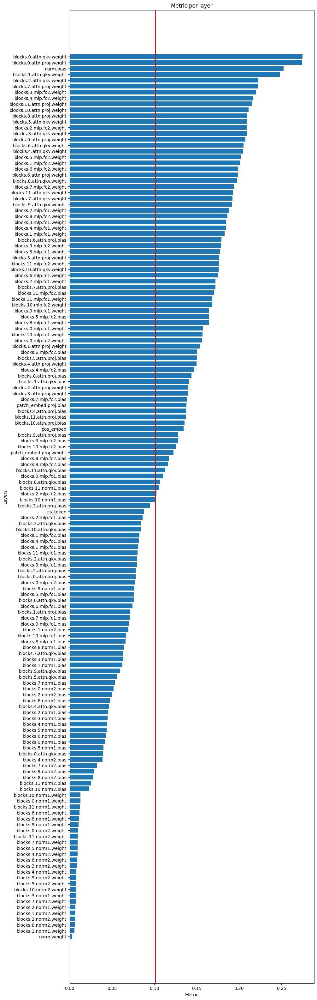

['blocks.10.norm1.bias' 'blocks.3.attn.proj.bias' 'cls_token'
 'blocks.2.mlp.fc1.bias' 'blocks.3.attn.qkv.bias'
 'blocks.10.attn.qkv.bias' 'blocks.1.mlp.fc2.bias' 'blocks.4.mlp.fc1.bias'
 'blocks.1.mlp.fc1.bias' 'blocks.11.mlp.fc1.bias' 'blocks.2.attn.qkv.bias'
 'blocks.3.mlp.fc1.bias' 'blocks.2.attn.proj.bias'
 'blocks.0.attn.proj.bias' 'blocks.0.mlp.fc2.bias' 'blocks.9.norm1.bias'
 'blocks.5.mlp.fc1.bias' 'blocks.6.attn.qkv.bias' 'blocks.6.mlp.fc1.bias'
 'blocks.1.attn.proj.bias' 'blocks.7.mlp.fc1.bias' 'blocks.9.mlp.fc1.bias'
 'blocks.1.norm2.bias' 'blocks.10.mlp.fc1.bias' 'blocks.8.mlp.fc1.bias'
 'blocks.8.norm1.bias' 'blocks.7.attn.qkv.bias' 'blocks.3.norm1.bias'
 'blocks.1.norm1.bias' 'blocks.9.attn.qkv.bias' 'blocks.5.attn.qkv.bias'
 'blocks.7.norm1.bias' 'blocks.0.norm2.bias' 'blocks.2.norm2.bias'
 'blocks.6.norm1.bias' 'blocks.4.attn.qkv.bias' 'blocks.2.norm1.bias'
 'blocks.3.norm2.bias' 'blocks.4.norm1.bias' 'blocks.5.norm2.bias'
 'blocks.6.norm2.bias' 'blocks.0.norm1.bias' '

In [79]:
from sandbox.eval_new_arch.dino4cells.utils import fine_tuning_utils
import pandas as pd

angles = fine_tuning_utils.compare_models(pretrained_model, finetuned_model, fine_tuning_utils.angle_metrics, skip_head=True)

percentile_cutoff = 50

fine_tuning_utils.plot_comparison(angles, percentile_cutoff)
changed_layers = fine_tuning_utils.get_changed_layers(angles, percentile_cutoff, is_above=False)
print(changed_layers)

# Eval

In [141]:
# Load the finetuned model

finetuned_model = vits.vit_tiny(
            img_size=[config.embedding.image_size, config.embedding.image_size],
            patch_size=config.patch_size,
            in_chans=config.num_channels,
            num_classes=config.num_classes
    ).cuda()

# chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/checkpoints/checkpoints_240724_121100_260570_878749/checkpoint_best.pth"

# chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/checkpoints/checkpoints_250724_153837_676628_21406_freeze_mostly_changed_layers/checkpoint_best.pth"
# chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/checkpoints/checkpoints_250724_153840_287274_21366_freeze_least_changed_layers/checkpoint_best.pth"
chkp_path = "/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/eval_new_arch/vit_fine_tuned/checkpoints/checkpoints_250724_160110_508711_27396_freeze_all_but_attn_blocks/checkpoint_best.pth"



finetuned_model = utils.load_model_from_checkpoint(chkp_path, finetuned_model)
finetuned_model

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(2, 192, kernel_size=(14, 14), stride=(14, 14))
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=192, out_features=576, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=192, out_features=192, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=192, out_features=768, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=768, out_features=192, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
  (head): Linear(in_features

In [142]:
# Inference!

def do_inference(model, data_loader_test, n_steps=30):
    preds_array = []
    lbls_array = []
    hidden_array = []

    with torch.no_grad():
        model.eval()

        for i, sample in enumerate(data_loader_test):
            inpt = sample['image'].to(torch.float).cuda()
            lbls = sample['label'].cpu().detach().numpy()
            lbls = dataset_test.id2label(lbls)
            preds, hidden = model(inpt, return_hidden=True)
            preds = preds.cpu()
            hidden = hidden.cpu()
            preds_array.append(preds)
            hidden_array.append(hidden)
            lbls_array.extend(lbls)
            print(preds.shape, lbls.shape, hidden.shape)

            if n_steps is not None and i >= n_steps:
                break

    preds_array = np.vstack(preds_array)
    hidden_array = np.vstack(hidden_array)
    lbls_array = np.asarray(lbls_array)
    
    return preds_array, hidden_array, lbls_array


######

preds_array, hidden_array, lbls_array = do_inference(finetuned_model, data_loader_test, n_steps=None)

preds_array.shape, hidden_array.shape, lbls_array.shape, np.unique(lbls_array)

2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Image shape: torch.Size([72, 2, 100, 100]), label shape: torch.Size([72])
2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Image shape: torch.Size([73, 2, 100, 100]), label shape: torch.Size([73])
2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:25 INFO Image shape: torch.Size([64, 2, 100, 100]), label shape: torch.Size([64])
2024-07-27 19:21:25 INFO Image shape: torch.Size([58, 2, 100, 100]), label shape: torch.Size([58])
2024-07-27 19:21:25 IN

torch.Size([64, 128]) (64,) torch.Size([64, 192])
torch.Size([71, 128]) (71,) torch.Size([71, 192])
torch.Size([73, 128]) (73,) torch.Size([73, 192])
torch.Size([76, 128]) (76,) torch.Size([76, 192])
torch.Size([58, 128]) (58,) torch.Size([58, 192])
torch.Size([72, 128]) (72,) torch.Size([72, 192])


2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([66, 2, 100, 100]), label shape: torch.Size([66])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([50, 2, 100, 100]), label shape: torch.Size([50])
2024-07-27 19:21:26 INFO Image shape: torch.Size([68, 2, 100, 100]), label shape: torch.Size([68])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([52, 2, 100, 100]), label shape: torch.Size([52])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([51, 2, 100, 100]), label shape: torch.Size([51])
2024-07-27 19:21:26 

torch.Size([83, 128]) (83,) torch.Size([83, 192])
torch.Size([72, 128]) (72,) torch.Size([72, 192])
torch.Size([83, 128]) (83,) torch.Size([83, 192])
torch.Size([81, 128]) (81,) torch.Size([81, 192])
torch.Size([45, 128]) (45,) torch.Size([45, 192])
torch.Size([52, 128]) (52,) torch.Size([52, 192])
torch.Size([68, 128]) (68,) torch.Size([68, 192])
torch.Size([52, 128]) (52,) torch.Size([52, 192])
torch.Size([68, 128]) (68,) torch.Size([68, 192])


2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([74, 2, 100, 100]), label shape: torch.Size([74])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([69, 2, 100, 100]), label shape: torch.Size([69])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([79, 2, 100, 100]), label shape: torch.Size([79])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([63, 2, 100, 100]), label shape: torch.Size([63])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]


torch.Size([50, 128]) (50,) torch.Size([50, 192])
torch.Size([51, 128]) (51,) torch.Size([51, 192])
torch.Size([66, 128]) (66,) torch.Size([66, 192])
torch.Size([69, 128]) (69,) torch.Size([69, 192])


2024-07-27 19:21:26 INFO Image shape: torch.Size([74, 2, 100, 100]), label shape: torch.Size([74])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([81, 2, 100, 100]), label shape: torch.Size([81])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([68, 2, 100, 100]), label shape: torch.Size([68])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([98, 2, 100, 100]), label shape: torch.Size([98])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([99, 2, 100, 100]), label shape: torch.Size([99])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 

torch.Size([63, 128]) (63,) torch.Size([63, 192])
torch.Size([74, 128]) (74,) torch.Size([74, 192])
torch.Size([81, 128]) (81,) torch.Size([81, 192])
torch.Size([79, 128]) (79,) torch.Size([79, 192])
torch.Size([74, 128]) (74,) torch.Size([74, 192])
torch.Size([98, 128]) (98,) torch.Size([98, 192])


2024-07-27 19:21:26 INFO Image shape: torch.Size([110, 2, 100, 100]), label shape: torch.Size([110])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([79, 2, 100, 100]), label shape: torch.Size([79])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:26 INFO Image shape: torch.Size([66, 2, 100, 100]), label shape: torch.Size([66])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([65, 2, 100, 100]), label shape: torch.Size([65])
2024-07-27 19:21:26 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([66, 2, 100, 100]), label shape: torch.Size([66])
2024-07-27 19:21:2

torch.Size([110, 128]) (110,) torch.Size([110, 192])
torch.Size([87, 128]) (87,) torch.Size([87, 192])
torch.Size([79, 128]) (79,) torch.Size([79, 192])
torch.Size([99, 128]) (99,) torch.Size([99, 192])
torch.Size([68, 128]) (68,) torch.Size([68, 192])


2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([84, 2, 100, 100]), label shape: torch.Size([84])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([28, 2, 100, 100]), label shape: torch.Size([28])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([85, 2, 100, 100]), label shape: torch.Size([85])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([28, 2, 100, 100]), label shape: torch.Size([28])
2024-07-27 19:21:27 INFO Image shape: torch.Size([47, 2, 100, 100]), label shape: torch.Size([47])


torch.Size([66, 128]) (66,) torch.Size([66, 192])
torch.Size([76, 128]) (76,) torch.Size([76, 192])
torch.Size([68, 128]) (68,) torch.Size([68, 192])
torch.Size([77, 128]) (77,) torch.Size([77, 192])
torch.Size([65, 128]) (65,) torch.Size([65, 192])
torch.Size([66, 128]) (66,) torch.Size([66, 192])
torch.Size([84, 128]) (84,) torch.Size([84, 192])


2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([34, 2, 100, 100]), label shape: torch.Size([34])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([31, 2, 100, 100]), label shape: torch.Size([31])
2024-07-27 19:21:27 INFO Image shape: torch.Size([33, 2, 100, 100]), label shape: torch.Size([33])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([27, 2, 100, 100]), label shape: torch.Size([27])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 IN

torch.Size([85, 128]) (85,) torch.Size([85, 192])
torch.Size([47, 128]) (47,) torch.Size([47, 192])
torch.Size([34, 128]) (34,) torch.Size([34, 192])
torch.Size([28, 128]) (28,) torch.Size([28, 192])
torch.Size([28, 128]) (28,) torch.Size([28, 192])
torch.Size([31, 128]) (31,) torch.Size([31, 192])
torch.Size([27, 128]) (27,) torch.Size([27, 192])
torch.Size([36, 128]) (36,) torch.Size([36, 192])


2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([29, 2, 100, 100]), label shape: torch.Size([29])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([30, 2, 100, 100]), label shape: torch.Size([30])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([42, 2, 100, 100]), label shape: torch.Size([42])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([33, 2, 100, 100]), label shape: torch.Size([33])
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 IN

torch.Size([29, 128]) (29,) torch.Size([29, 192])
torch.Size([29, 128]) (29,) torch.Size([29, 192])
torch.Size([33, 128]) (33,) torch.Size([33, 192])
torch.Size([30, 128]) (30,) torch.Size([30, 192])
torch.Size([33, 128]) (33,) torch.Size([33, 192])
torch.Size([35, 128]) (35,) torch.Size([35, 192])
torch.Size([39, 128]) (39,) torch.Size([39, 192])
torch.Size([32, 128]) (32,) torch.Size([32, 192])
torch.Size([42, 128]) (42,) torch.Size([42, 192])
torch.Size([21, 128]) (21,) torch.Size([21, 192])


2024-07-27 19:21:27 INFO Resources (Free, Used, Total): [('39509 MiB', '8960 MiB', '49140 MiB')]
2024-07-27 19:21:27 INFO Image shape: torch.Size([34, 2, 100, 100]), label shape: torch.Size([34])


torch.Size([34, 128]) (34,) torch.Size([34, 192])


((3341, 128),
 (3341, 192),
 (3341,),
 array(['TDP43B_TDP43_Untreated', 'TDP43B_TDP43_dox',
        'TDP43B_WT_Untreated'], dtype='<U22'))

## Freeze mostly changed layers

/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shape: (511, 128)
class: CD41_WT_Untreated, shape: (461, 128)
class: CLTC_WT_Untreated, shape: (416, 128)
class: Calreticulin_WT_Untreated, shape: (434, 128)
class: DAPI_WT_Untreated, shape: (411, 128)
class: DCP1A_WT_Untreated, shape: (340, 128)
class: FUS_WT_Untreated, shape: (357, 128)
class: G3BP1_WT_Untreated, shape: (438, 128)
class: GM130_WT_Untreated, shape: (423, 128)
class: KIF5A_WT_Untreated, shape: (396, 128)
class: LAMP1_WT_Untreated, shape: (398, 128)
class: NCL_WT_Untreated, shape: (339, 128)
class: NEMO_WT_Untreated, shape: (500, 128)
class: NONO_WT_Untreated, shape: (498, 128)
class: PEX14_WT_Untreated, shape: (473, 128)
class: PML_WT_Untreated, shape: (420, 128)
class: PSD95_WT_Untreated, shape: (407, 128)
class: PURA_WT_Untreated, shape: (417, 128)
class: Phalloidin_WT_Untreated, shape: (447, 128)
class: SCNA_WT_Untreated, shape: (435, 128)
class: SQSTM1_WT_Untreated, shape: (442, 128)
class: TDP43_WT_Untreated, shape: (493, 128)
class: TO

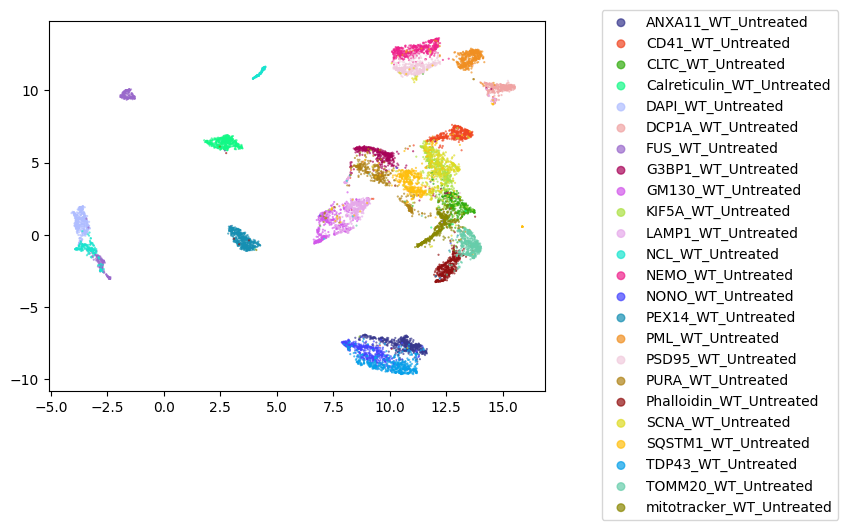

In [45]:
# UMAP1
########

plot_umap1(preds_array, lbls_array, markers=None)

['G3BP1_WT_Untreated', 'G3BP1_WT_stress'] G3BP1
classes: ['G3BP1_WT_Untreated' 'G3BP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: G3BP1_WT_Untreated, shappe: (834, 128)
class: G3BP1_WT_stress, shappe: (854, 128)


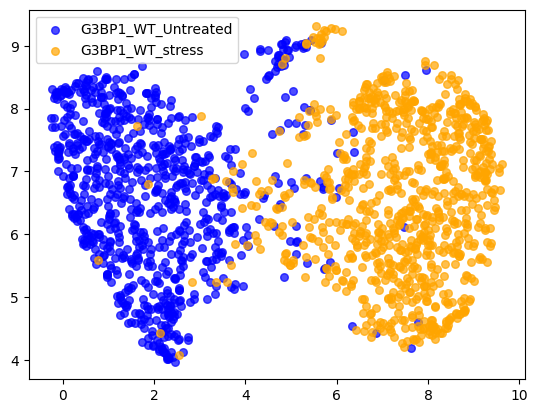

['PML_WT_Untreated', 'PML_WT_stress'] PML
classes: ['PML_WT_Untreated' 'PML_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PML_WT_Untreated, shappe: (701, 128)
class: PML_WT_stress, shappe: (785, 128)


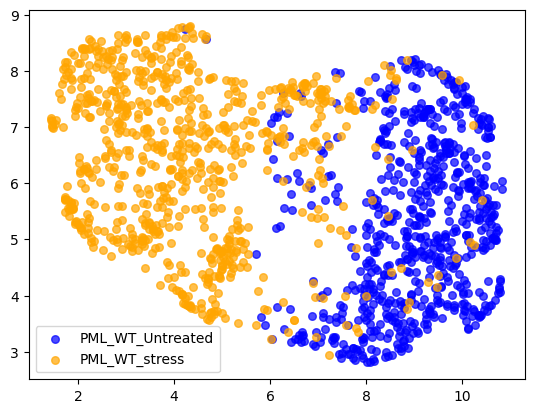

['PURA_WT_Untreated', 'PURA_WT_stress'] PURA
classes: ['PURA_WT_Untreated' 'PURA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PURA_WT_Untreated, shappe: (812, 128)
class: PURA_WT_stress, shappe: (854, 128)


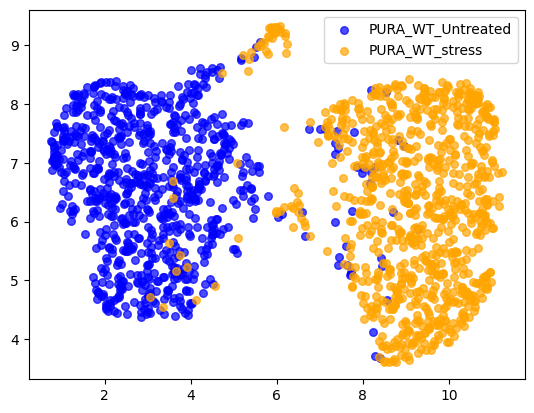

['LAMP1_WT_Untreated', 'LAMP1_WT_stress'] LAMP1
classes: ['LAMP1_WT_Untreated' 'LAMP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: LAMP1_WT_Untreated, shappe: (544, 128)
class: LAMP1_WT_stress, shappe: (568, 128)


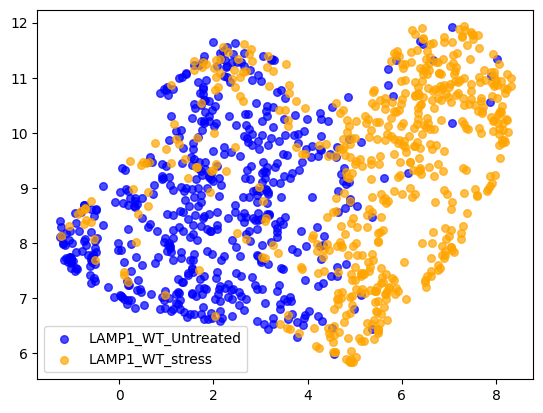

['Calreticulin_WT_Untreated', 'Calreticulin_WT_stress'] Calreticulin
classes: ['Calreticulin_WT_Untreated' 'Calreticulin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Calreticulin_WT_Untreated, shappe: (657, 128)
class: Calreticulin_WT_stress, shappe: (754, 128)


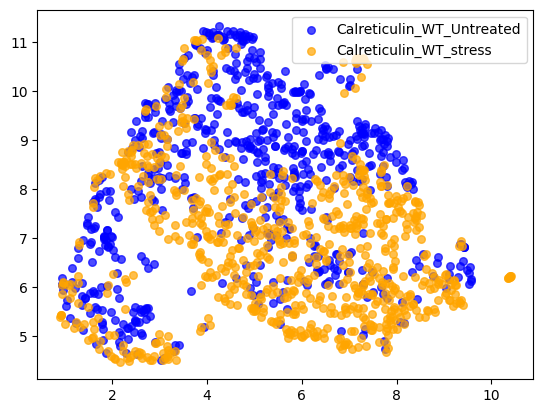

['TOMM20_WT_Untreated', 'TOMM20_WT_stress'] TOMM20
classes: ['TOMM20_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TOMM20_WT_Untreated, shappe: (762, 128)


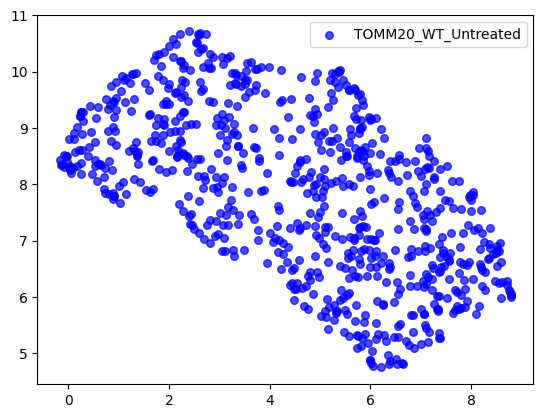

['PSD95_WT_Untreated', 'PSD95_WT_stress'] PSD95
classes: ['PSD95_WT_Untreated' 'PSD95_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PSD95_WT_Untreated, shappe: (661, 128)
class: PSD95_WT_stress, shappe: (699, 128)


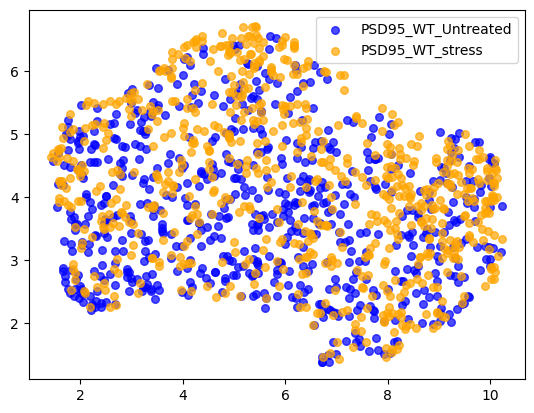

['mitotracker_WT_Untreated', 'mitotracker_WT_stress'] mitotracker
classes: ['mitotracker_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: mitotracker_WT_Untreated, shappe: (701, 128)


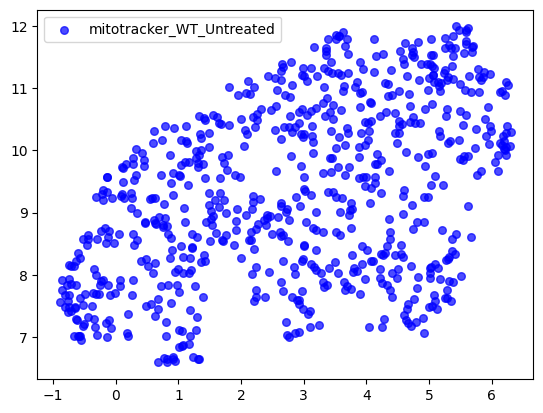

['KIF5A_WT_Untreated', 'KIF5A_WT_stress'] KIF5A
classes: ['KIF5A_WT_Untreated' 'KIF5A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: KIF5A_WT_Untreated, shappe: (834, 128)
class: KIF5A_WT_stress, shappe: (848, 128)


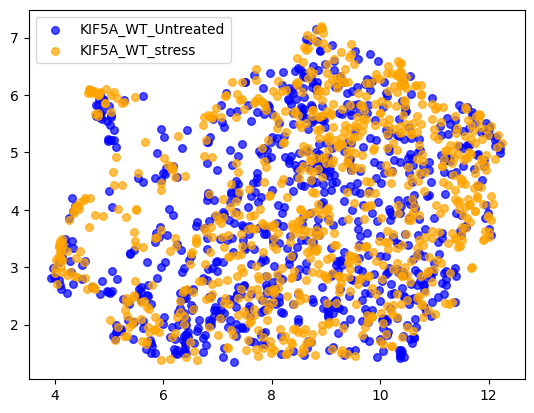

['CLTC_WT_Untreated', 'CLTC_WT_stress'] CLTC
classes: ['CLTC_WT_Untreated' 'CLTC_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CLTC_WT_Untreated, shappe: (666, 128)
class: CLTC_WT_stress, shappe: (699, 128)


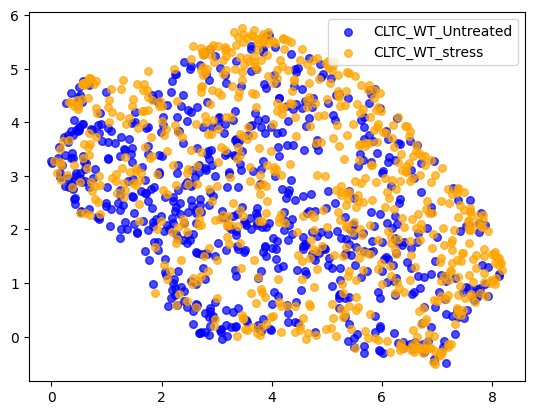

['SCNA_WT_Untreated', 'SCNA_WT_stress'] SCNA
classes: ['SCNA_WT_Untreated' 'SCNA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SCNA_WT_Untreated, shappe: (724, 128)
class: SCNA_WT_stress, shappe: (718, 128)


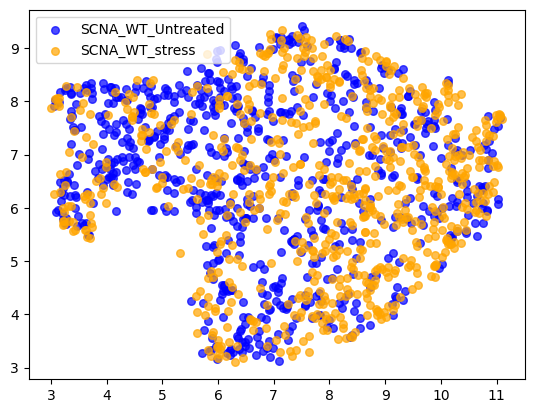

['CD41_WT_Untreated', 'CD41_WT_stress'] CD41
classes: ['CD41_WT_Untreated' 'CD41_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CD41_WT_Untreated, shappe: (806, 128)
class: CD41_WT_stress, shappe: (772, 128)


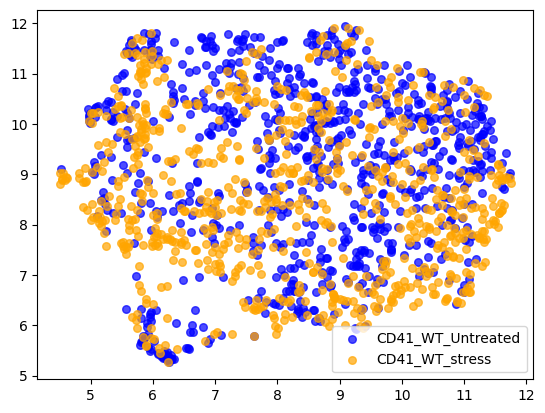

['FUS_WT_Untreated', 'FUS_WT_stress'] FUS
classes: ['FUS_WT_Untreated' 'FUS_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_WT_Untreated, shappe: (962, 128)
class: FUS_WT_stress, shappe: (965, 128)


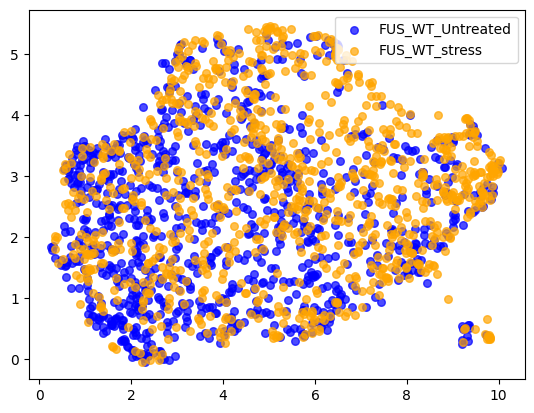

['ANXA11_WT_Untreated', 'ANXA11_WT_stress'] ANXA11
classes: ['ANXA11_WT_Untreated' 'ANXA11_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shappe: (816, 128)
class: ANXA11_WT_stress, shappe: (780, 128)


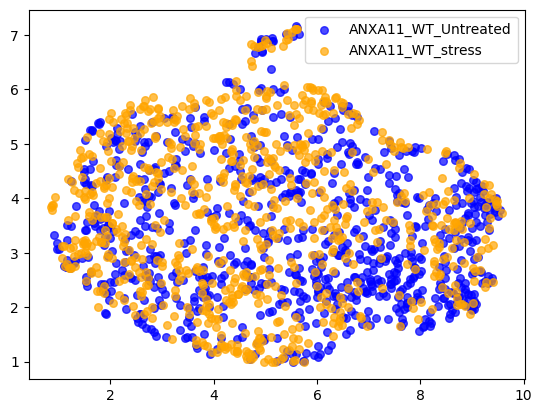

['Phalloidin_WT_Untreated', 'Phalloidin_WT_stress'] Phalloidin
classes: ['Phalloidin_WT_Untreated' 'Phalloidin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Phalloidin_WT_Untreated, shappe: (752, 128)
class: Phalloidin_WT_stress, shappe: (713, 128)


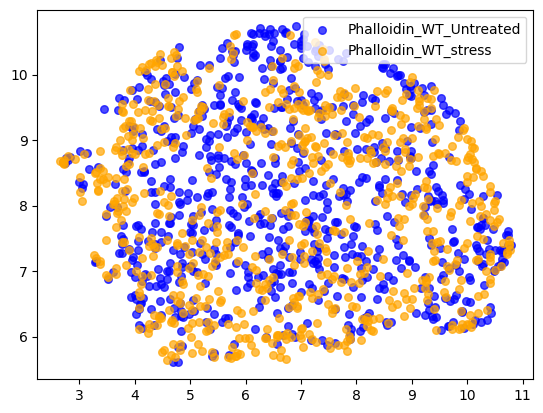

['SQSTM1_WT_Untreated', 'SQSTM1_WT_stress'] SQSTM1
classes: ['SQSTM1_WT_Untreated' 'SQSTM1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SQSTM1_WT_Untreated, shappe: (744, 128)
class: SQSTM1_WT_stress, shappe: (18, 128)


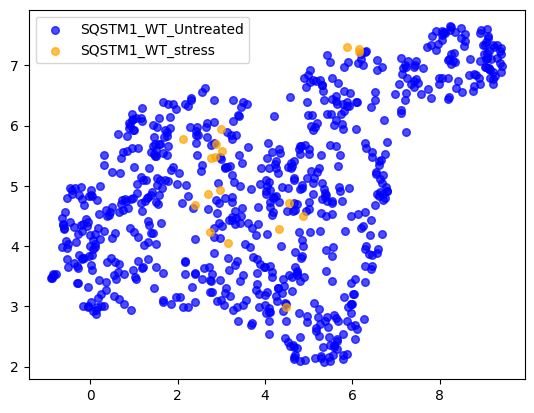

['GM130_WT_Untreated', 'GM130_WT_stress'] GM130
classes: ['GM130_WT_Untreated' 'GM130_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: GM130_WT_Untreated, shappe: (749, 128)
class: GM130_WT_stress, shappe: (742, 128)


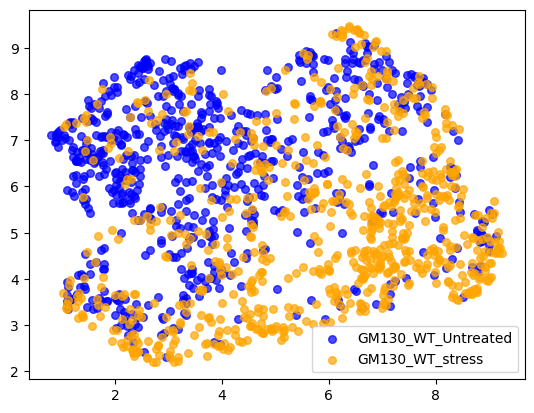

['TDP43_WT_Untreated', 'TDP43_WT_stress'] TDP43
classes: ['TDP43_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43_WT_Untreated, shappe: (806, 128)


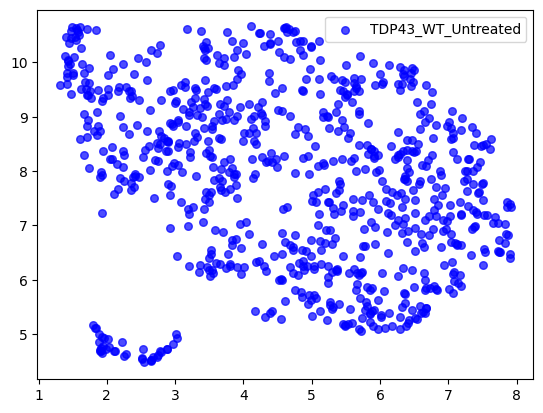

['PEX14_WT_Untreated', 'PEX14_WT_stress'] PEX14
classes: ['PEX14_WT_Untreated' 'PEX14_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PEX14_WT_Untreated, shappe: (701, 128)
class: PEX14_WT_stress, shappe: (785, 128)


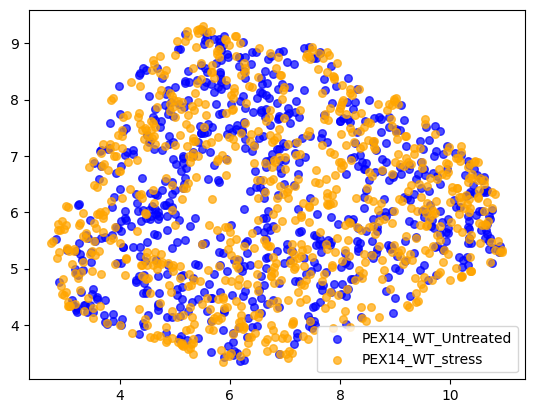

['NCL_WT_Untreated', 'NCL_WT_stress'] NCL
classes: ['NCL_WT_Untreated' 'NCL_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NCL_WT_Untreated, shappe: (962, 128)
class: NCL_WT_stress, shappe: (954, 128)


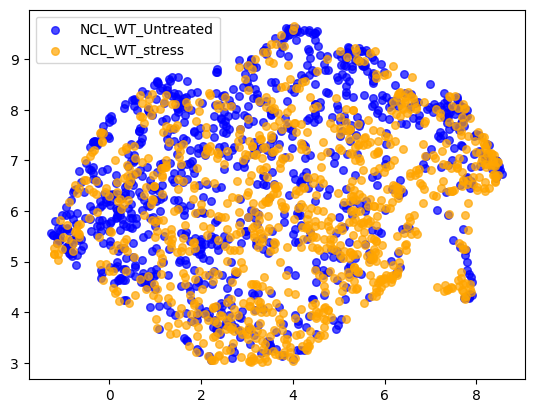

['NONO_WT_Untreated', 'NONO_WT_stress'] NONO
classes: ['NONO_WT_Untreated' 'NONO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NONO_WT_Untreated, shappe: (806, 128)
class: NONO_WT_stress, shappe: (772, 128)


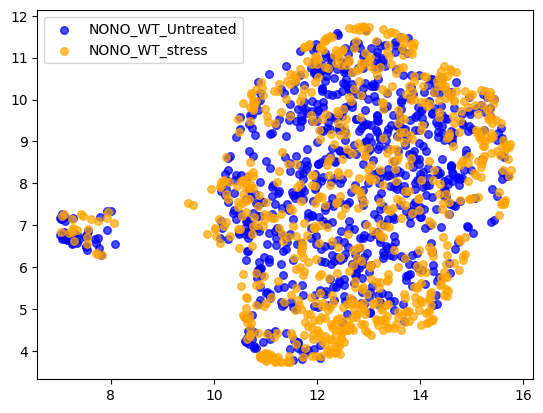

['DCP1A_WT_Untreated', 'DCP1A_WT_stress'] DCP1A
classes: ['DCP1A_WT_Untreated' 'DCP1A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: DCP1A_WT_Untreated, shappe: (203, 128)
class: DCP1A_WT_stress, shappe: (709, 128)


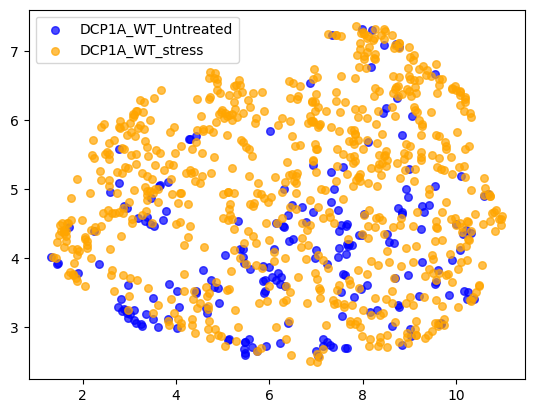

['NEMO_WT_Untreated', 'NEMO_WT_stress'] NEMO
classes: ['NEMO_WT_Untreated' 'NEMO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NEMO_WT_Untreated, shappe: (540, 128)
class: NEMO_WT_stress, shappe: (762, 128)


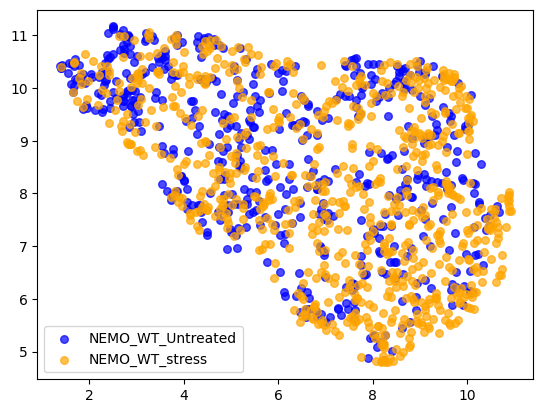

In [18]:
# UMAP0
#######

cell_lines = [[f'WT_Untreated', f'WT_stress']]#,
                     # [f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['G3BP1', 'PML', "PURA", "LAMP1", 'Calreticulin', 'TOMM20', 'PSD95', \
                       'mitotracker', 'KIF5A', 'CLTC', 'SCNA', 'CD41', 'FUS', 'ANXA11',\
                       'Phalloidin', 'SQSTM1', 'GM130', 'TDP43', 'PEX14', 'NCL', 'NONO', 'DCP1A', 'NEMO']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['FUS_FUSHeterozygous', 'FUS_FUSHomozygous', 'FUS_FUSRevertant', 'FUS_WT_Untreated'] FUS
classes: ['FUS_FUSHeterozygous_Untreated' 'FUS_FUSHomozygous_Untreated'
 'FUS_FUSRevertant_Untreated' 'FUS_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_FUSHeterozygous_Untreated, shappe: (386, 128)
class: FUS_FUSHomozygous_Untreated, shappe: (989, 128)
class: FUS_FUSRevertant_Untreated, shappe: (1011, 128)
class: FUS_WT_Untreated, shappe: (962, 128)


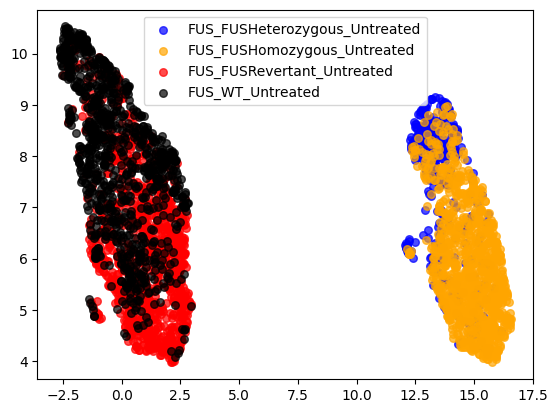

In [65]:
# UMAP0
#######

cell_lines =  [[f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['FUS']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['TDP43B_WT_Untreated', 'TDP43B_TDP43_Untreated', 'TDP43B_TDP43_dox'] TDP43B
classes: ['TDP43B_TDP43_Untreated' 'TDP43B_TDP43_dox' 'TDP43B_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43B_TDP43_Untreated, shappe: (1301, 128)
class: TDP43B_TDP43_dox, shappe: (1472, 128)
class: TDP43B_WT_Untreated, shappe: (570, 128)


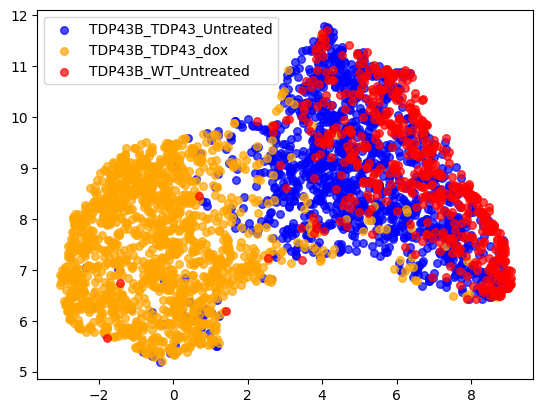

In [85]:
# UMAP0
#######

cell_lines =  [[f'WT_Untreated', f'TDP43_Untreated', f'TDP43_dox']]
markers_sorted = ['TDP43B']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

## Freeze least changesget_subset layers

/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shape: (511, 128)
class: CD41_WT_Untreated, shape: (461, 128)
class: CLTC_WT_Untreated, shape: (416, 128)
class: Calreticulin_WT_Untreated, shape: (434, 128)
class: DAPI_WT_Untreated, shape: (411, 128)
class: DCP1A_WT_Untreated, shape: (340, 128)
class: FUS_WT_Untreated, shape: (357, 128)
class: G3BP1_WT_Untreated, shape: (438, 128)
class: GM130_WT_Untreated, shape: (423, 128)
class: KIF5A_WT_Untreated, shape: (396, 128)
class: LAMP1_WT_Untreated, shape: (398, 128)
class: NCL_WT_Untreated, shape: (339, 128)
class: NEMO_WT_Untreated, shape: (500, 128)
class: NONO_WT_Untreated, shape: (498, 128)
class: PEX14_WT_Untreated, shape: (473, 128)
class: PML_WT_Untreated, shape: (420, 128)
class: PSD95_WT_Untreated, shape: (407, 128)
class: PURA_WT_Untreated, shape: (417, 128)
class: Phalloidin_WT_Untreated, shape: (447, 128)
class: SCNA_WT_Untreated, shape: (435, 128)
class: SQSTM1_WT_Untreated, shape: (442, 128)
class: TDP43_WT_Untreated, shape: (493, 128)
class: TO

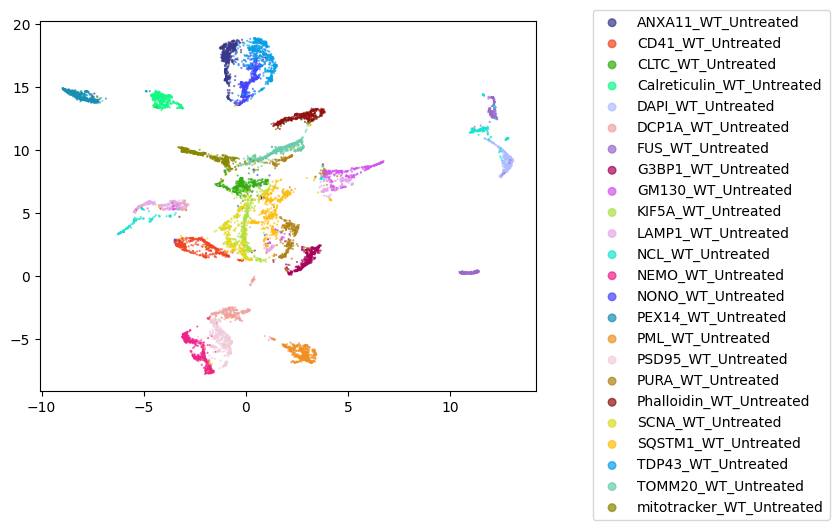

In [94]:
# UMAP1
########

plot_umap1(preds_array, lbls_array, markers=None)

['G3BP1_WT_Untreated', 'G3BP1_WT_stress'] G3BP1
classes: ['G3BP1_WT_Untreated' 'G3BP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: G3BP1_WT_Untreated, shappe: (834, 128)
class: G3BP1_WT_stress, shappe: (854, 128)


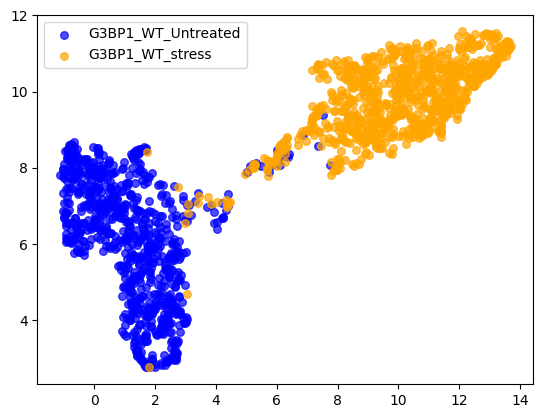

['PML_WT_Untreated', 'PML_WT_stress'] PML
classes: ['PML_WT_Untreated' 'PML_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PML_WT_Untreated, shappe: (701, 128)
class: PML_WT_stress, shappe: (785, 128)


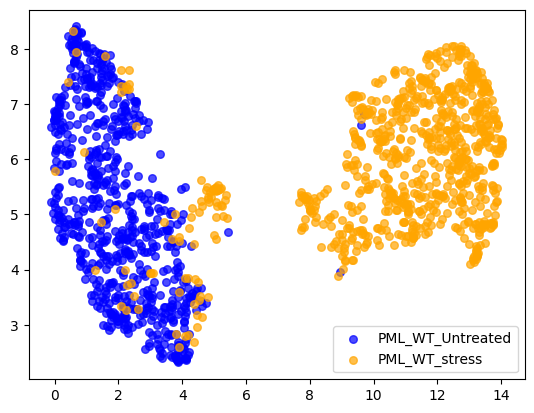

['PURA_WT_Untreated', 'PURA_WT_stress'] PURA
classes: ['PURA_WT_Untreated' 'PURA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PURA_WT_Untreated, shappe: (812, 128)
class: PURA_WT_stress, shappe: (854, 128)


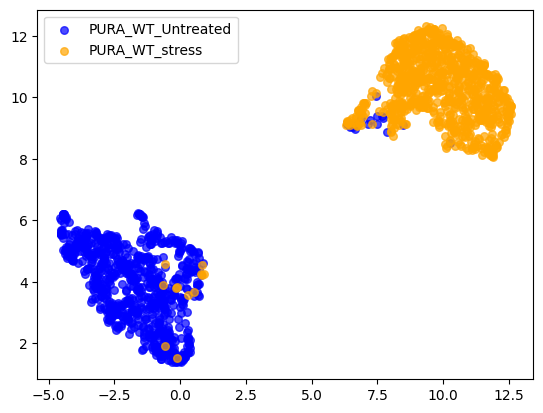

['LAMP1_WT_Untreated', 'LAMP1_WT_stress'] LAMP1
classes: ['LAMP1_WT_Untreated' 'LAMP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: LAMP1_WT_Untreated, shappe: (544, 128)
class: LAMP1_WT_stress, shappe: (568, 128)


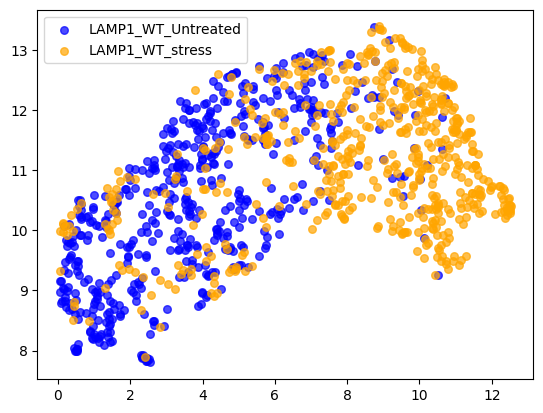

['Calreticulin_WT_Untreated', 'Calreticulin_WT_stress'] Calreticulin
classes: ['Calreticulin_WT_Untreated' 'Calreticulin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Calreticulin_WT_Untreated, shappe: (657, 128)
class: Calreticulin_WT_stress, shappe: (754, 128)


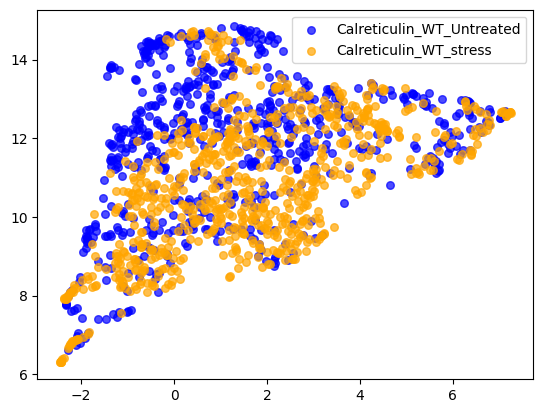

['TOMM20_WT_Untreated', 'TOMM20_WT_stress'] TOMM20
classes: ['TOMM20_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TOMM20_WT_Untreated, shappe: (762, 128)


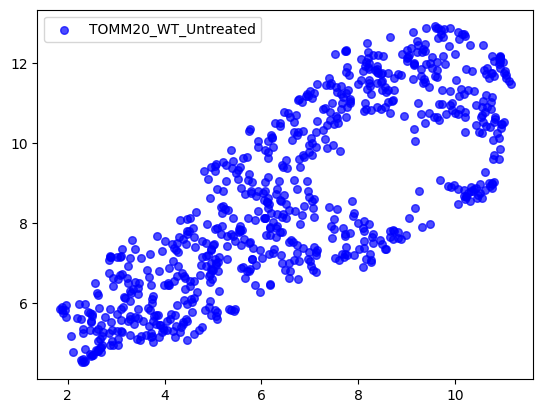

['PSD95_WT_Untreated', 'PSD95_WT_stress'] PSD95
classes: ['PSD95_WT_Untreated' 'PSD95_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PSD95_WT_Untreated, shappe: (661, 128)
class: PSD95_WT_stress, shappe: (699, 128)


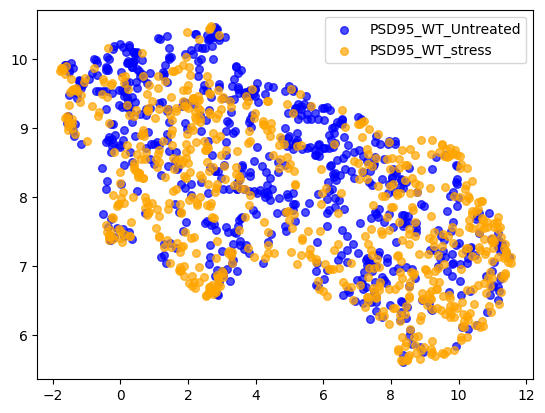

['mitotracker_WT_Untreated', 'mitotracker_WT_stress'] mitotracker
classes: ['mitotracker_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: mitotracker_WT_Untreated, shappe: (701, 128)


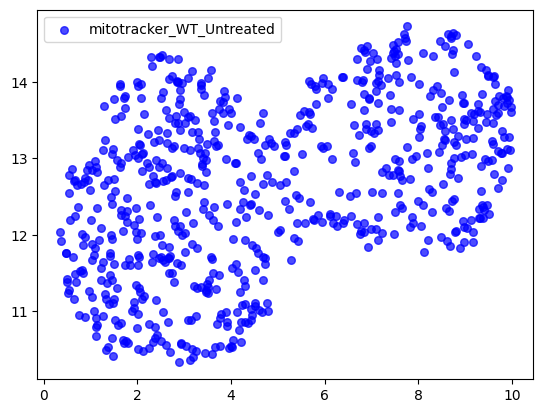

['KIF5A_WT_Untreated', 'KIF5A_WT_stress'] KIF5A
classes: ['KIF5A_WT_Untreated' 'KIF5A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: KIF5A_WT_Untreated, shappe: (834, 128)
class: KIF5A_WT_stress, shappe: (848, 128)


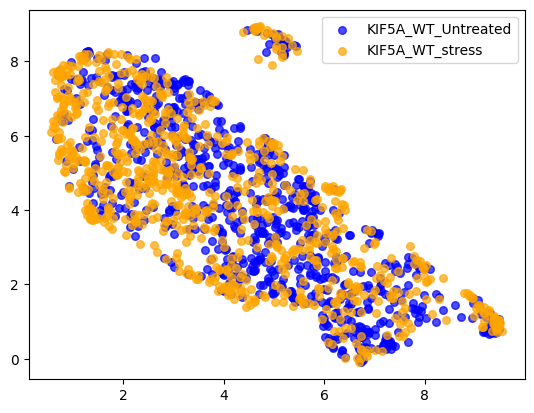

['CLTC_WT_Untreated', 'CLTC_WT_stress'] CLTC
classes: ['CLTC_WT_Untreated' 'CLTC_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CLTC_WT_Untreated, shappe: (666, 128)
class: CLTC_WT_stress, shappe: (699, 128)


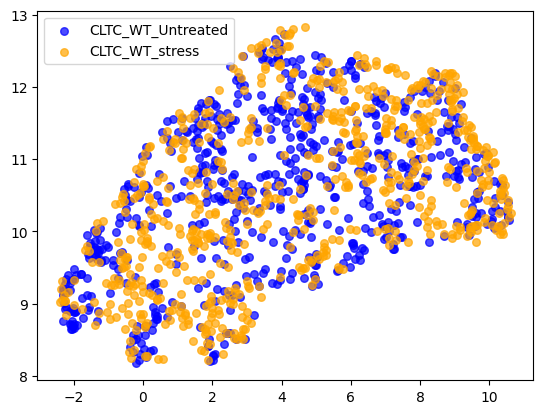

['SCNA_WT_Untreated', 'SCNA_WT_stress'] SCNA
classes: ['SCNA_WT_Untreated' 'SCNA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SCNA_WT_Untreated, shappe: (724, 128)
class: SCNA_WT_stress, shappe: (718, 128)


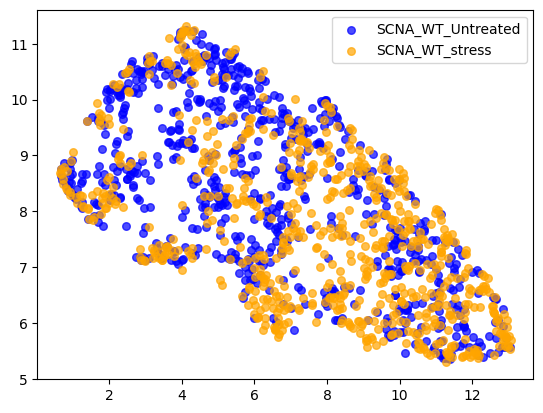

['CD41_WT_Untreated', 'CD41_WT_stress'] CD41
classes: ['CD41_WT_Untreated' 'CD41_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CD41_WT_Untreated, shappe: (806, 128)
class: CD41_WT_stress, shappe: (772, 128)


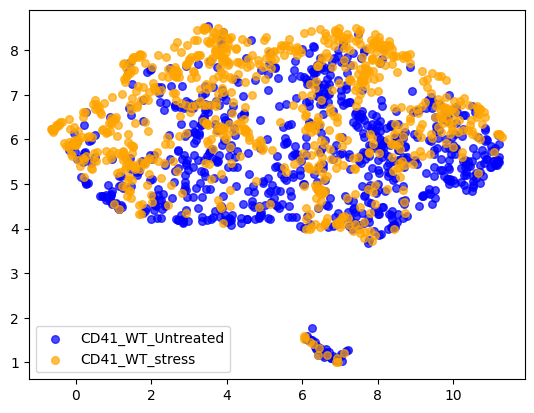

['FUS_WT_Untreated', 'FUS_WT_stress'] FUS
classes: ['FUS_WT_Untreated' 'FUS_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_WT_Untreated, shappe: (962, 128)
class: FUS_WT_stress, shappe: (965, 128)


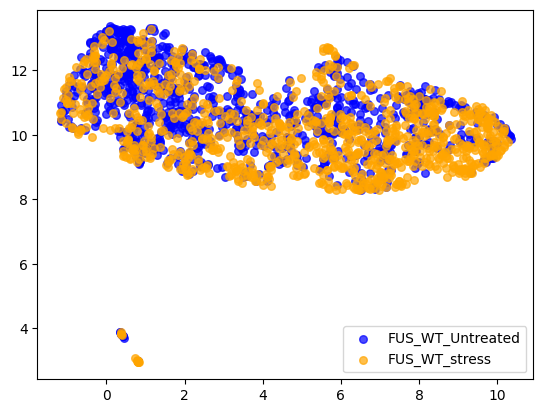

['ANXA11_WT_Untreated', 'ANXA11_WT_stress'] ANXA11
classes: ['ANXA11_WT_Untreated' 'ANXA11_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shappe: (816, 128)
class: ANXA11_WT_stress, shappe: (780, 128)


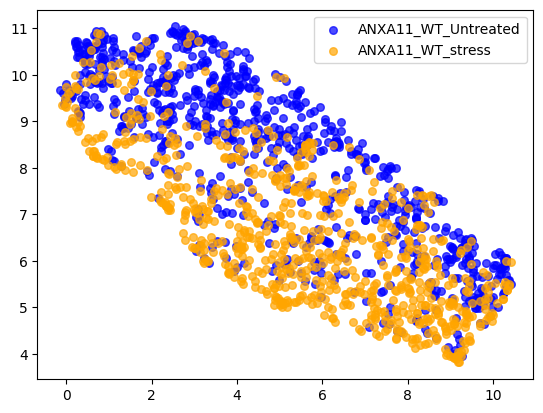

['Phalloidin_WT_Untreated', 'Phalloidin_WT_stress'] Phalloidin
classes: ['Phalloidin_WT_Untreated' 'Phalloidin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Phalloidin_WT_Untreated, shappe: (752, 128)
class: Phalloidin_WT_stress, shappe: (713, 128)


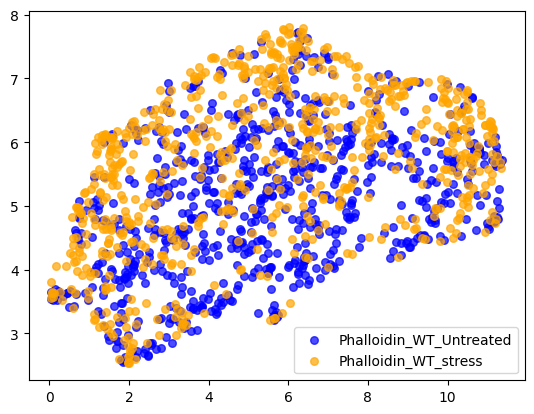

['SQSTM1_WT_Untreated', 'SQSTM1_WT_stress'] SQSTM1
classes: ['SQSTM1_WT_Untreated' 'SQSTM1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SQSTM1_WT_Untreated, shappe: (744, 128)
class: SQSTM1_WT_stress, shappe: (18, 128)


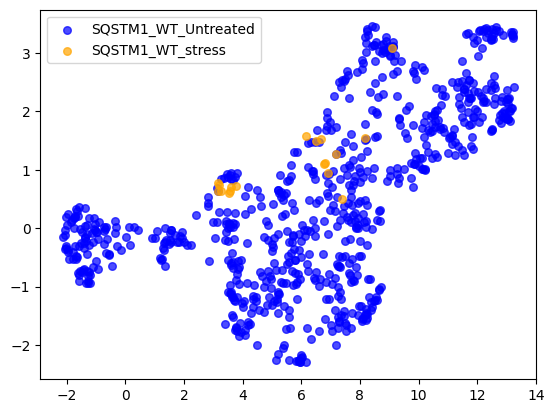

['GM130_WT_Untreated', 'GM130_WT_stress'] GM130
classes: ['GM130_WT_Untreated' 'GM130_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: GM130_WT_Untreated, shappe: (749, 128)
class: GM130_WT_stress, shappe: (742, 128)


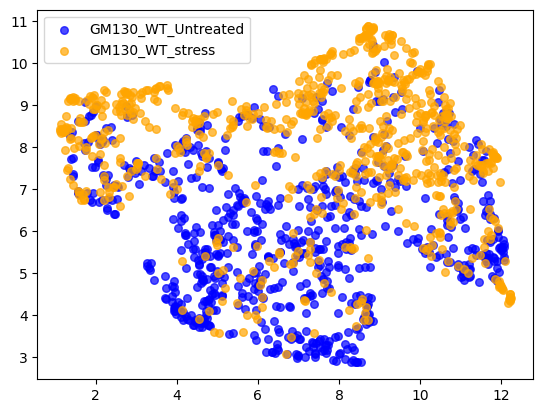

['TDP43_WT_Untreated', 'TDP43_WT_stress'] TDP43
classes: ['TDP43_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43_WT_Untreated, shappe: (806, 128)


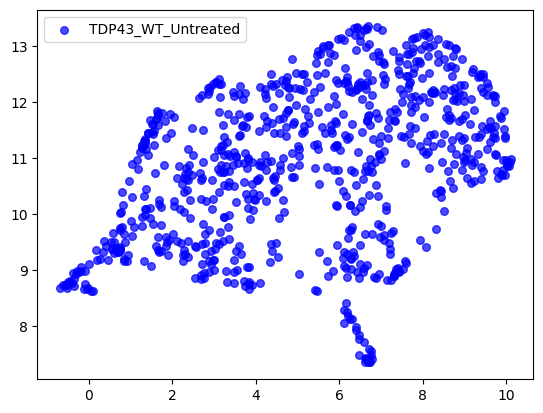

['PEX14_WT_Untreated', 'PEX14_WT_stress'] PEX14
classes: ['PEX14_WT_Untreated' 'PEX14_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PEX14_WT_Untreated, shappe: (701, 128)
class: PEX14_WT_stress, shappe: (785, 128)


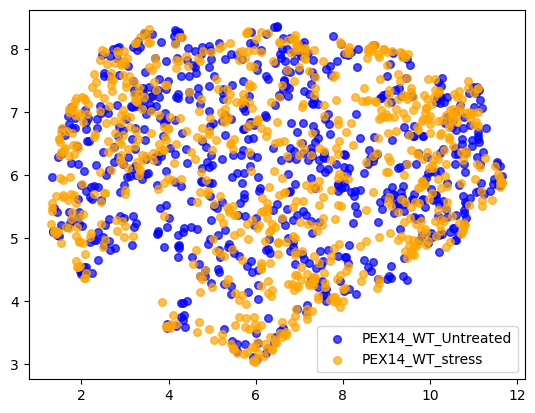

['NCL_WT_Untreated', 'NCL_WT_stress'] NCL
classes: ['NCL_WT_Untreated' 'NCL_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NCL_WT_Untreated, shappe: (962, 128)
class: NCL_WT_stress, shappe: (954, 128)


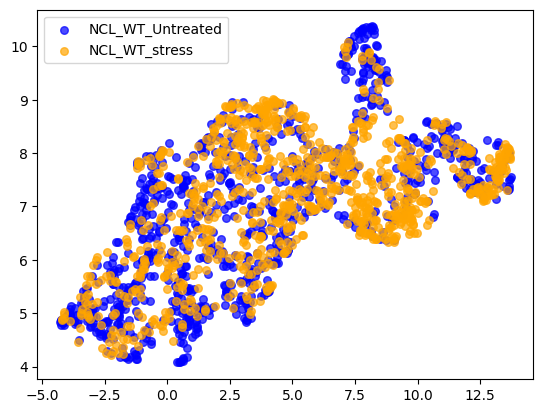

['NONO_WT_Untreated', 'NONO_WT_stress'] NONO
classes: ['NONO_WT_Untreated' 'NONO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NONO_WT_Untreated, shappe: (806, 128)
class: NONO_WT_stress, shappe: (772, 128)


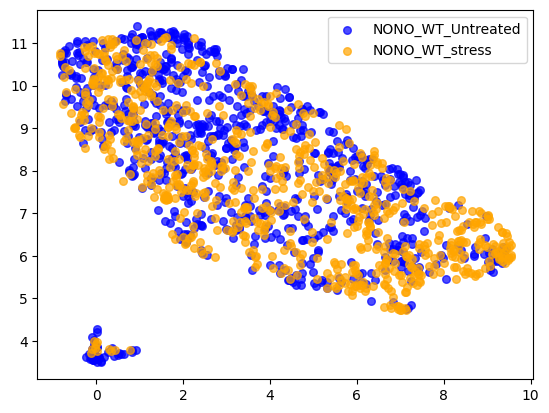

['DCP1A_WT_Untreated', 'DCP1A_WT_stress'] DCP1A
classes: ['DCP1A_WT_Untreated' 'DCP1A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: DCP1A_WT_Untreated, shappe: (203, 128)
class: DCP1A_WT_stress, shappe: (709, 128)


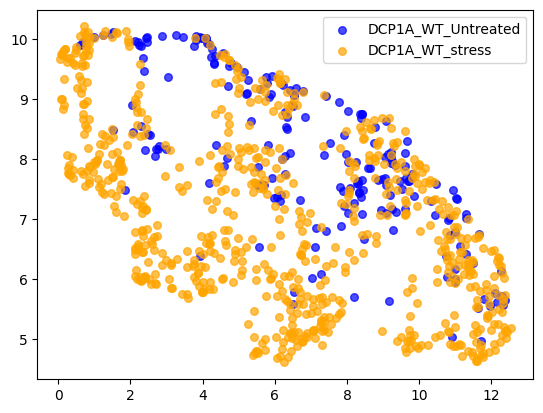

['NEMO_WT_Untreated', 'NEMO_WT_stress'] NEMO
classes: ['NEMO_WT_Untreated' 'NEMO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NEMO_WT_Untreated, shappe: (540, 128)
class: NEMO_WT_stress, shappe: (762, 128)


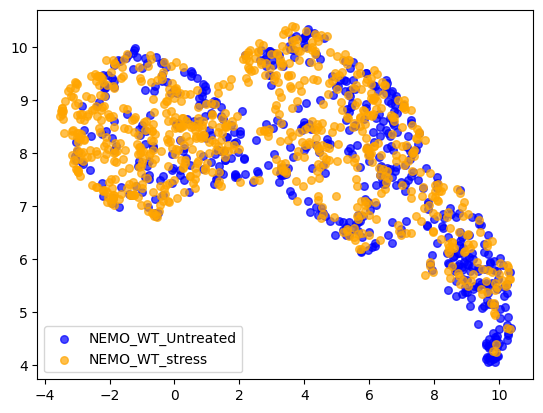

In [107]:
# UMAP0
#######

cell_lines = [[f'WT_Untreated', f'WT_stress']]#,
                     # [f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['G3BP1', 'PML', "PURA", "LAMP1", 'Calreticulin', 'TOMM20', 'PSD95', \
                       'mitotracker', 'KIF5A', 'CLTC', 'SCNA', 'CD41', 'FUS', 'ANXA11',\
                       'Phalloidin', 'SQSTM1', 'GM130', 'TDP43', 'PEX14', 'NCL', 'NONO', 'DCP1A', 'NEMO']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['FUS_FUSHeterozygous', 'FUS_FUSHomozygous', 'FUS_FUSRevertant', 'FUS_WT_Untreated'] FUS
classes: ['FUS_FUSHeterozygous_Untreated' 'FUS_FUSHomozygous_Untreated'
 'FUS_FUSRevertant_Untreated' 'FUS_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_FUSHeterozygous_Untreated, shappe: (386, 128)
class: FUS_FUSHomozygous_Untreated, shappe: (989, 128)
class: FUS_FUSRevertant_Untreated, shappe: (1011, 128)
class: FUS_WT_Untreated, shappe: (915, 128)


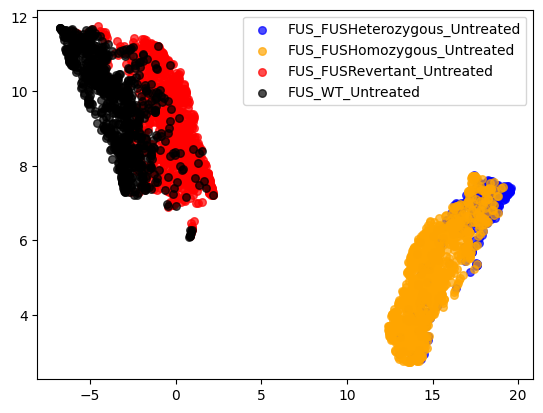

In [113]:
# UMAP0
#######

cell_lines =  [[f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['FUS']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['TDP43B_WT_Untreated', 'TDP43B_TDP43_Untreated', 'TDP43B_TDP43_dox'] TDP43B
classes: ['TDP43B_TDP43_Untreated' 'TDP43B_TDP43_dox' 'TDP43B_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43B_TDP43_Untreated, shappe: (1311, 128)
class: TDP43B_TDP43_dox, shappe: (1474, 128)
class: TDP43B_WT_Untreated, shappe: (556, 128)


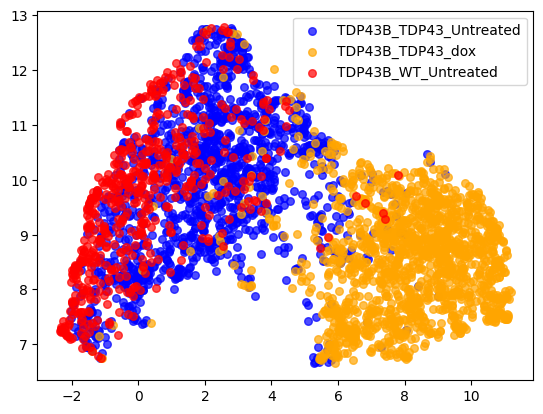

In [116]:
# UMAP0
#######

cell_lines =  [[f'WT_Untreated', f'TDP43_Untreated', f'TDP43_dox']]
markers_sorted = ['TDP43B']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

## Freeze all but attention blocks

/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shape: (511, 128)
class: CD41_WT_Untreated, shape: (461, 128)
class: CLTC_WT_Untreated, shape: (416, 128)
class: Calreticulin_WT_Untreated, shape: (434, 128)
class: DAPI_WT_Untreated, shape: (411, 128)
class: DCP1A_WT_Untreated, shape: (340, 128)
class: FUS_WT_Untreated, shape: (357, 128)
class: G3BP1_WT_Untreated, shape: (438, 128)
class: GM130_WT_Untreated, shape: (423, 128)
class: KIF5A_WT_Untreated, shape: (396, 128)
class: LAMP1_WT_Untreated, shape: (398, 128)
class: NCL_WT_Untreated, shape: (339, 128)
class: NEMO_WT_Untreated, shape: (500, 128)
class: NONO_WT_Untreated, shape: (498, 128)
class: PEX14_WT_Untreated, shape: (473, 128)
class: PML_WT_Untreated, shape: (420, 128)
class: PSD95_WT_Untreated, shape: (407, 128)
class: PURA_WT_Untreated, shape: (417, 128)
class: Phalloidin_WT_Untreated, shape: (447, 128)
class: SCNA_WT_Untreated, shape: (435, 128)
class: SQSTM1_WT_Untreated, shape: (442, 128)
class: TDP43_WT_Untreated, shape: (493, 128)
class: TO

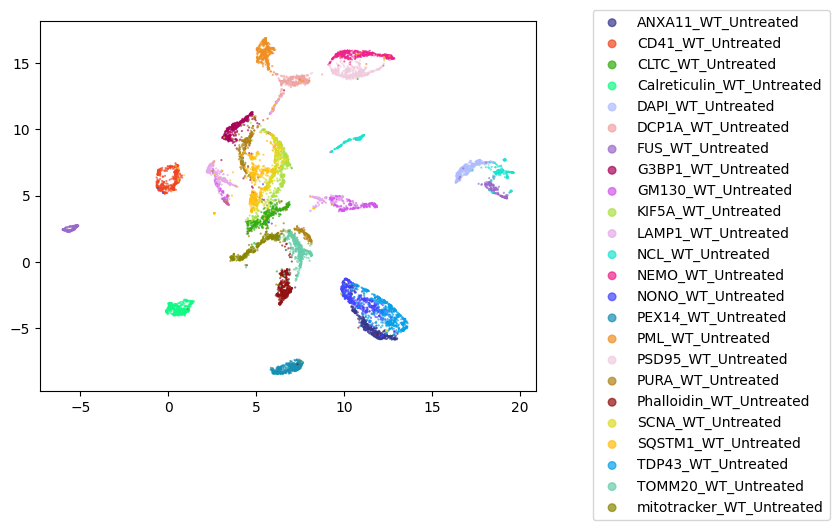

In [125]:
# UMAP1
########

plot_umap1(preds_array, lbls_array, markers=None)

['G3BP1_WT_Untreated', 'G3BP1_WT_stress'] G3BP1
classes: ['G3BP1_WT_Untreated' 'G3BP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: G3BP1_WT_Untreated, shappe: (834, 128)
class: G3BP1_WT_stress, shappe: (854, 128)


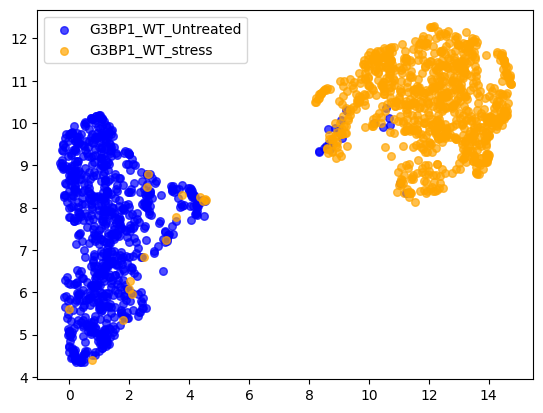

['PML_WT_Untreated', 'PML_WT_stress'] PML
classes: ['PML_WT_Untreated' 'PML_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PML_WT_Untreated, shappe: (701, 128)
class: PML_WT_stress, shappe: (785, 128)


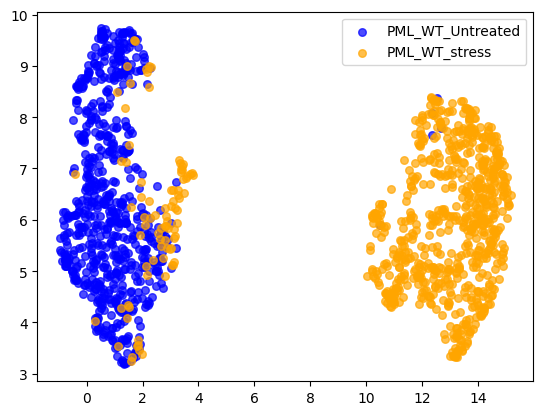

['PURA_WT_Untreated', 'PURA_WT_stress'] PURA
classes: ['PURA_WT_Untreated' 'PURA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PURA_WT_Untreated, shappe: (812, 128)
class: PURA_WT_stress, shappe: (854, 128)


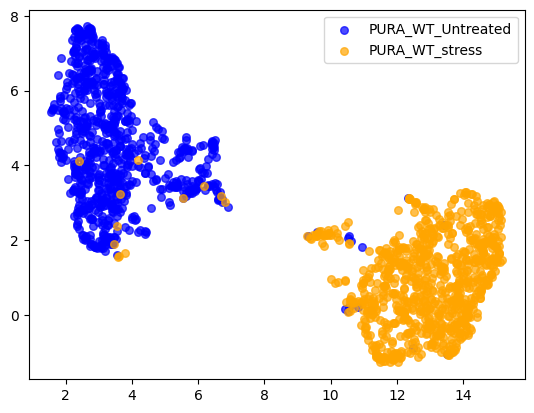

['LAMP1_WT_Untreated', 'LAMP1_WT_stress'] LAMP1
classes: ['LAMP1_WT_Untreated' 'LAMP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: LAMP1_WT_Untreated, shappe: (544, 128)
class: LAMP1_WT_stress, shappe: (568, 128)


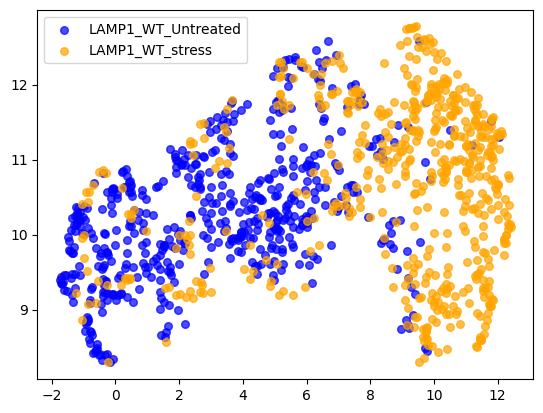

['Calreticulin_WT_Untreated', 'Calreticulin_WT_stress'] Calreticulin
classes: ['Calreticulin_WT_Untreated' 'Calreticulin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Calreticulin_WT_Untreated, shappe: (657, 128)
class: Calreticulin_WT_stress, shappe: (754, 128)


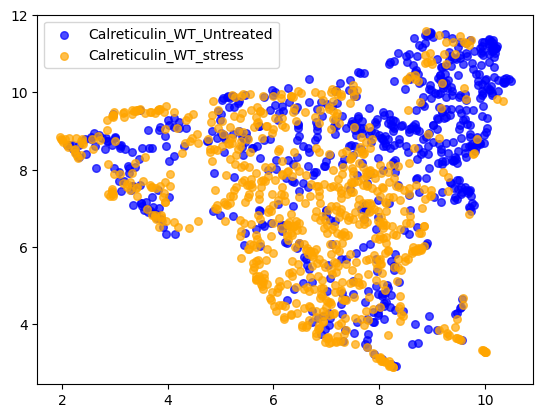

['TOMM20_WT_Untreated', 'TOMM20_WT_stress'] TOMM20
classes: ['TOMM20_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TOMM20_WT_Untreated, shappe: (762, 128)


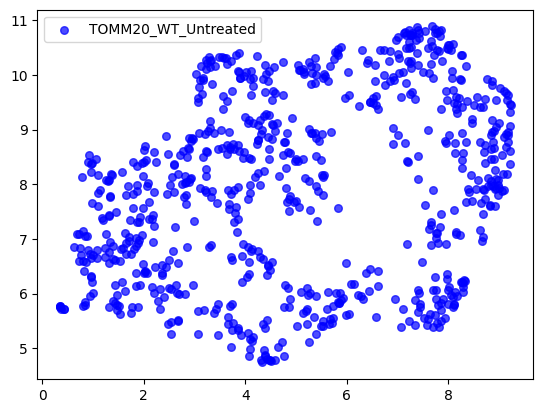

['PSD95_WT_Untreated', 'PSD95_WT_stress'] PSD95
classes: ['PSD95_WT_Untreated' 'PSD95_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PSD95_WT_Untreated, shappe: (661, 128)
class: PSD95_WT_stress, shappe: (699, 128)


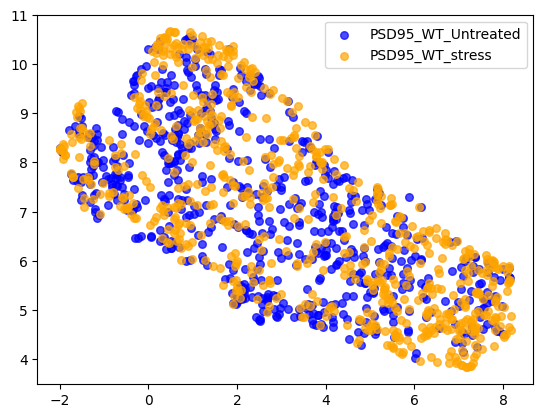

['mitotracker_WT_Untreated', 'mitotracker_WT_stress'] mitotracker
classes: ['mitotracker_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: mitotracker_WT_Untreated, shappe: (701, 128)


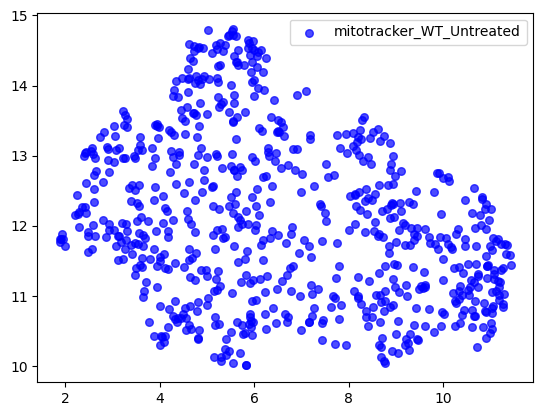

['KIF5A_WT_Untreated', 'KIF5A_WT_stress'] KIF5A
classes: ['KIF5A_WT_Untreated' 'KIF5A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: KIF5A_WT_Untreated, shappe: (834, 128)
class: KIF5A_WT_stress, shappe: (848, 128)


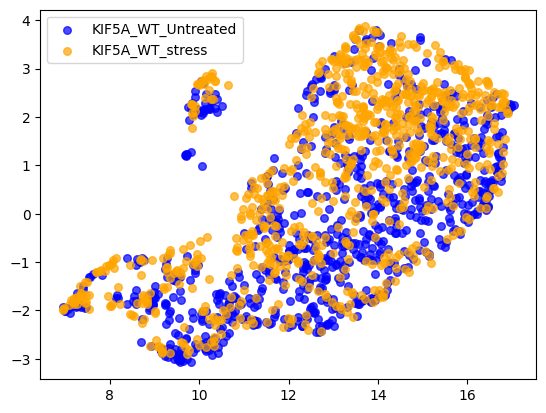

['CLTC_WT_Untreated', 'CLTC_WT_stress'] CLTC
classes: ['CLTC_WT_Untreated' 'CLTC_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CLTC_WT_Untreated, shappe: (666, 128)
class: CLTC_WT_stress, shappe: (699, 128)


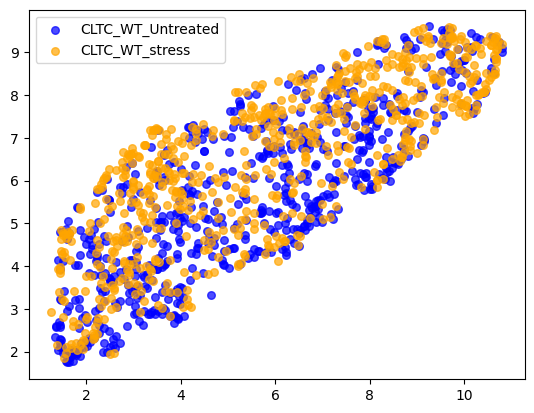

['SCNA_WT_Untreated', 'SCNA_WT_stress'] SCNA
classes: ['SCNA_WT_Untreated' 'SCNA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SCNA_WT_Untreated, shappe: (724, 128)
class: SCNA_WT_stress, shappe: (718, 128)


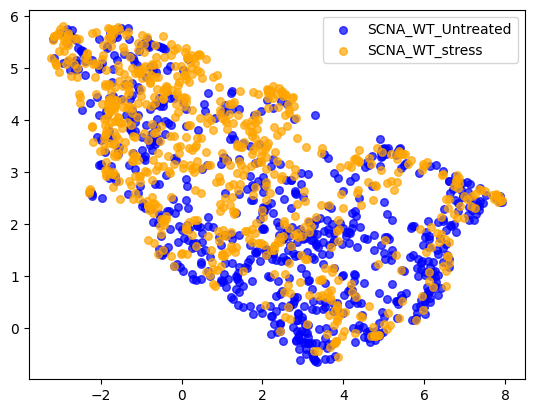

['CD41_WT_Untreated', 'CD41_WT_stress'] CD41
classes: ['CD41_WT_Untreated' 'CD41_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CD41_WT_Untreated, shappe: (806, 128)
class: CD41_WT_stress, shappe: (772, 128)


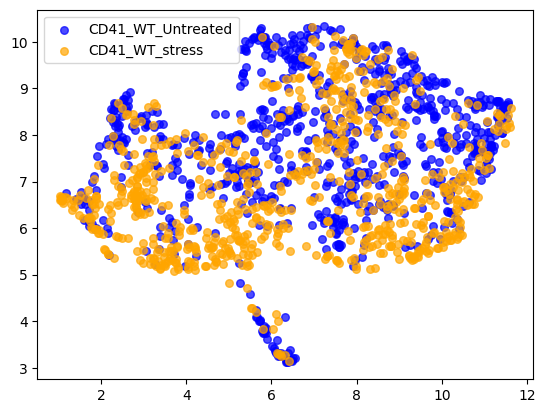

['FUS_WT_Untreated', 'FUS_WT_stress'] FUS
classes: ['FUS_WT_Untreated' 'FUS_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_WT_Untreated, shappe: (962, 128)
class: FUS_WT_stress, shappe: (965, 128)


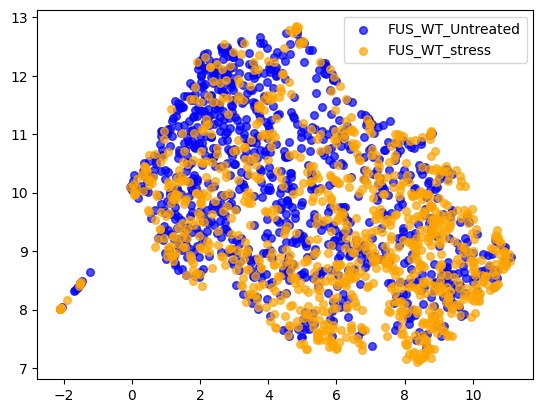

['ANXA11_WT_Untreated', 'ANXA11_WT_stress'] ANXA11
classes: ['ANXA11_WT_Untreated' 'ANXA11_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shappe: (816, 128)
class: ANXA11_WT_stress, shappe: (780, 128)


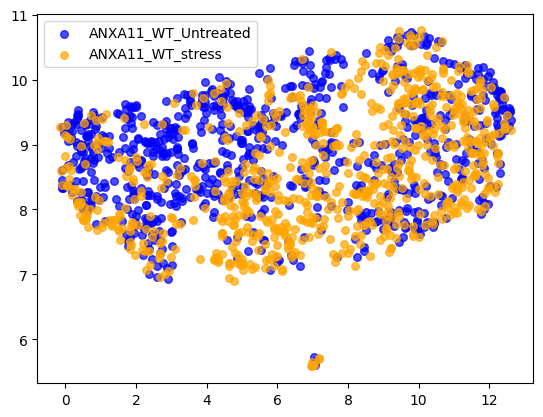

['Phalloidin_WT_Untreated', 'Phalloidin_WT_stress'] Phalloidin
classes: ['Phalloidin_WT_Untreated' 'Phalloidin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Phalloidin_WT_Untreated, shappe: (752, 128)
class: Phalloidin_WT_stress, shappe: (713, 128)


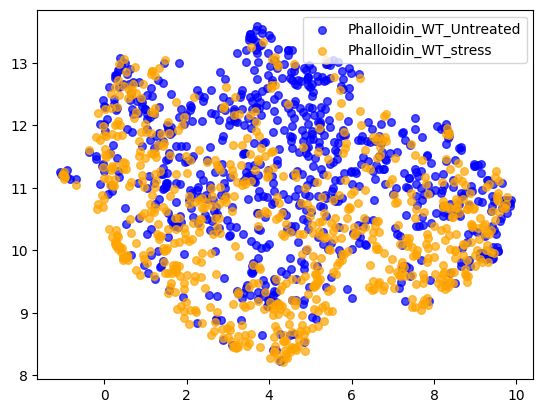

['SQSTM1_WT_Untreated', 'SQSTM1_WT_stress'] SQSTM1
classes: ['SQSTM1_WT_Untreated' 'SQSTM1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SQSTM1_WT_Untreated, shappe: (744, 128)
class: SQSTM1_WT_stress, shappe: (18, 128)


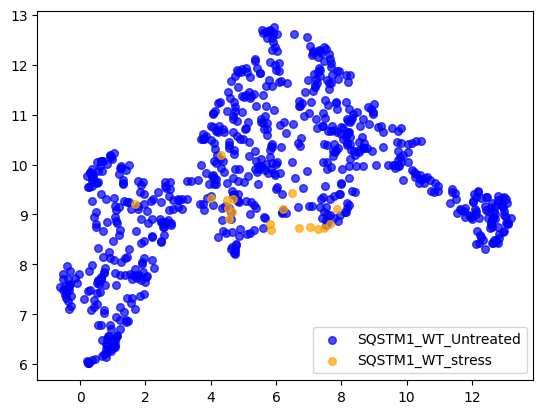

['GM130_WT_Untreated', 'GM130_WT_stress'] GM130
classes: ['GM130_WT_Untreated' 'GM130_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: GM130_WT_Untreated, shappe: (749, 128)
class: GM130_WT_stress, shappe: (742, 128)


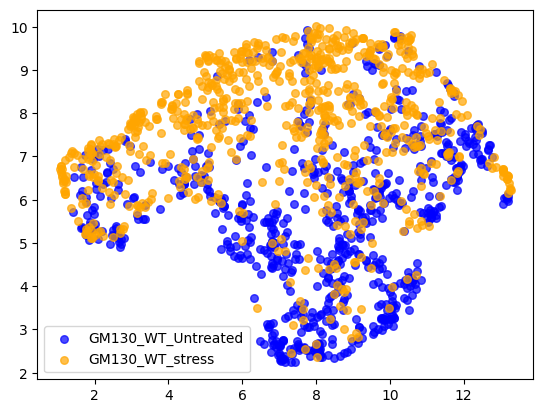

['TDP43_WT_Untreated', 'TDP43_WT_stress'] TDP43
classes: ['TDP43_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43_WT_Untreated, shappe: (806, 128)


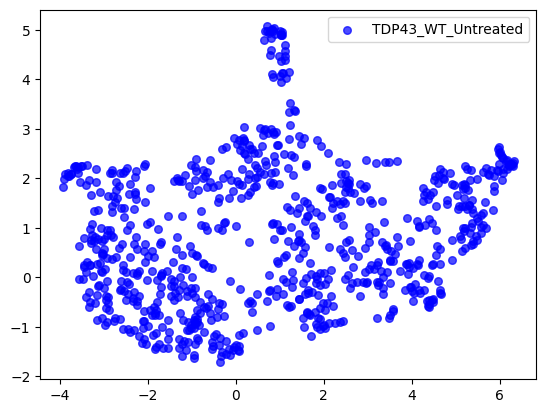

['PEX14_WT_Untreated', 'PEX14_WT_stress'] PEX14
classes: ['PEX14_WT_Untreated' 'PEX14_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PEX14_WT_Untreated, shappe: (701, 128)
class: PEX14_WT_stress, shappe: (785, 128)


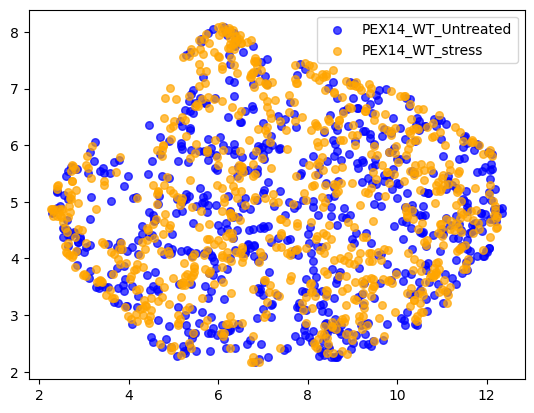

['NCL_WT_Untreated', 'NCL_WT_stress'] NCL
classes: ['NCL_WT_Untreated' 'NCL_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NCL_WT_Untreated, shappe: (962, 128)
class: NCL_WT_stress, shappe: (954, 128)


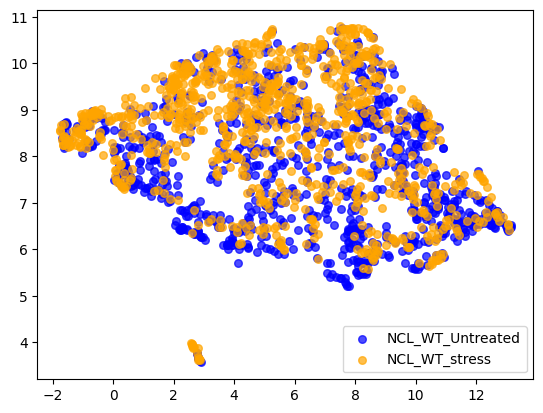

['NONO_WT_Untreated', 'NONO_WT_stress'] NONO
classes: ['NONO_WT_Untreated' 'NONO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NONO_WT_Untreated, shappe: (806, 128)
class: NONO_WT_stress, shappe: (772, 128)


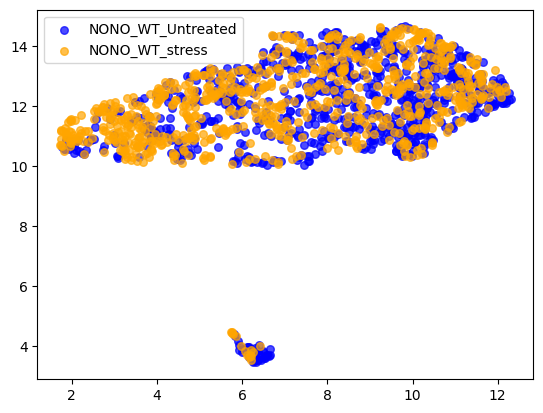

['DCP1A_WT_Untreated', 'DCP1A_WT_stress'] DCP1A
classes: ['DCP1A_WT_Untreated' 'DCP1A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: DCP1A_WT_Untreated, shappe: (203, 128)
class: DCP1A_WT_stress, shappe: (709, 128)


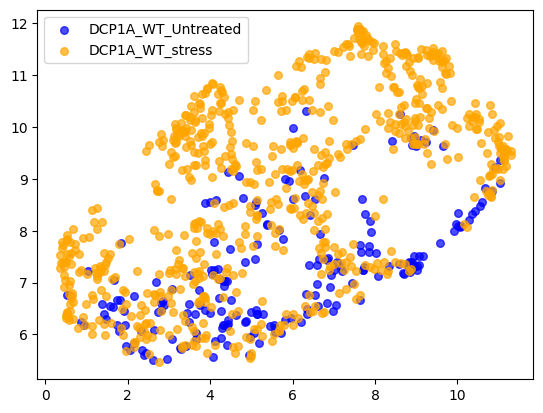

['NEMO_WT_Untreated', 'NEMO_WT_stress'] NEMO
classes: ['NEMO_WT_Untreated' 'NEMO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NEMO_WT_Untreated, shappe: (540, 128)
class: NEMO_WT_stress, shappe: (762, 128)


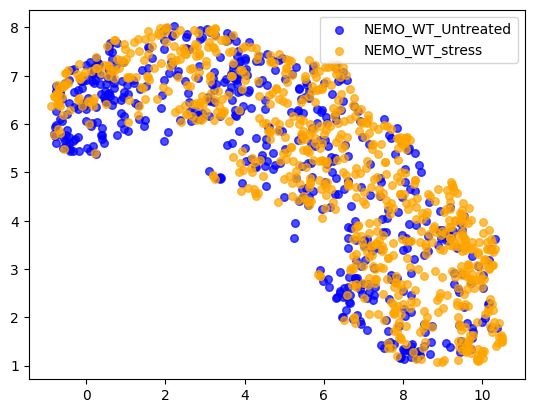

In [134]:
# UMAP0
#######

cell_lines = [[f'WT_Untreated', f'WT_stress']]#,
                     # [f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['G3BP1', 'PML', "PURA", "LAMP1", 'Calreticulin', 'TOMM20', 'PSD95', \
                       'mitotracker', 'KIF5A', 'CLTC', 'SCNA', 'CD41', 'FUS', 'ANXA11',\
                       'Phalloidin', 'SQSTM1', 'GM130', 'TDP43', 'PEX14', 'NCL', 'NONO', 'DCP1A', 'NEMO']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['FUS_FUSHeterozygous', 'FUS_FUSHomozygous', 'FUS_FUSRevertant', 'FUS_WT_Untreated'] FUS
classes: ['FUS_FUSHeterozygous_Untreated' 'FUS_FUSHomozygous_Untreated'
 'FUS_FUSRevertant_Untreated' 'FUS_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_FUSHeterozygous_Untreated, shappe: (386, 128)
class: FUS_FUSHomozygous_Untreated, shappe: (989, 128)
class: FUS_FUSRevertant_Untreated, shappe: (1011, 128)
class: FUS_WT_Untreated, shappe: (915, 128)


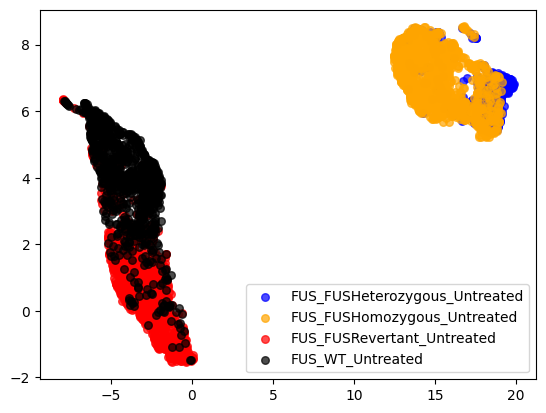

In [139]:
# UMAP0
#######

cell_lines =  [[f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['FUS']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['TDP43B_WT_Untreated', 'TDP43B_TDP43_Untreated', 'TDP43B_TDP43_dox'] TDP43B
classes: ['TDP43B_TDP43_Untreated' 'TDP43B_TDP43_dox' 'TDP43B_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43B_TDP43_Untreated, shappe: (1311, 128)
class: TDP43B_TDP43_dox, shappe: (1474, 128)
class: TDP43B_WT_Untreated, shappe: (556, 128)


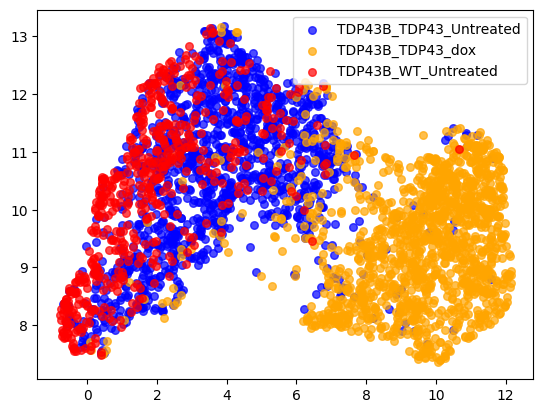

In [143]:
# UMAP0
#######

cell_lines =  [[f'WT_Untreated', f'TDP43_Untreated', f'TDP43_dox']]
markers_sorted = ['TDP43B']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

## No-Freeze

/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shape: (511, 128)
class: CD41_WT_Untreated, shape: (461, 128)
class: CLTC_WT_Untreated, shape: (416, 128)
class: Calreticulin_WT_Untreated, shape: (434, 128)
class: DAPI_WT_Untreated, shape: (411, 128)
class: DCP1A_WT_Untreated, shape: (340, 128)
class: FUS_WT_Untreated, shape: (357, 128)
class: G3BP1_WT_Untreated, shape: (438, 128)
class: GM130_WT_Untreated, shape: (423, 128)
class: KIF5A_WT_Untreated, shape: (396, 128)
class: LAMP1_WT_Untreated, shape: (398, 128)
class: NCL_WT_Untreated, shape: (339, 128)
class: NEMO_WT_Untreated, shape: (500, 128)
class: NONO_WT_Untreated, shape: (498, 128)
class: PEX14_WT_Untreated, shape: (473, 128)
class: PML_WT_Untreated, shape: (420, 128)
class: PSD95_WT_Untreated, shape: (407, 128)
class: PURA_WT_Untreated, shape: (417, 128)
class: Phalloidin_WT_Untreated, shape: (447, 128)
class: SCNA_WT_Untreated, shape: (435, 128)
class: SQSTM1_WT_Untreated, shape: (442, 128)
class: TDP43_WT_Untreated, shape: (493, 128)
class: TO

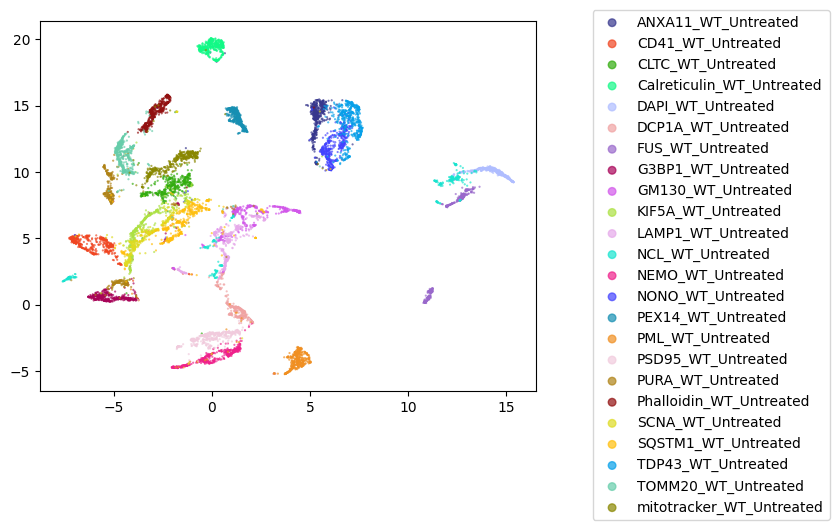

In [51]:
# UMAP1
########

plot_umap1(preds_array, lbls_array, markers=None)

/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shape: (511, 128)
class: CD41_WT_Untreated, shape: (461, 128)
class: CLTC_WT_Untreated, shape: (416, 128)
class: Calreticulin_WT_Untreated, shape: (434, 128)
class: DAPI_WT_Untreated, shape: (4872, 128)
class: DCP1A_WT_Untreated, shape: (340, 128)
class: FUS_WT_Untreated, shape: (357, 128)
class: G3BP1_WT_Untreated, shape: (438, 128)
class: GM130_WT_Untreated, shape: (423, 128)
class: KIF5A_WT_Untreated, shape: (396, 128)
class: LAMP1_WT_Untreated, shape: (398, 128)
class: NCL_WT_Untreated, shape: (339, 128)
class: NEMO_WT_Untreated, shape: (500, 128)
class: NONO_WT_Untreated, shape: (498, 128)
class: PEX14_WT_Untreated, shape: (473, 128)
class: PML_WT_Untreated, shape: (420, 128)
class: PSD95_WT_Untreated, shape: (407, 128)
class: PURA_WT_Untreated, shape: (417, 128)
class: Phalloidin_WT_Untreated, shape: (447, 128)
class: SCNA_WT_Untreated, shape: (435, 128)
class: SQSTM1_WT_Untreated, shape: (442, 128)
class: TDP43_WT_Untreated, shape: (493, 128)
class: T

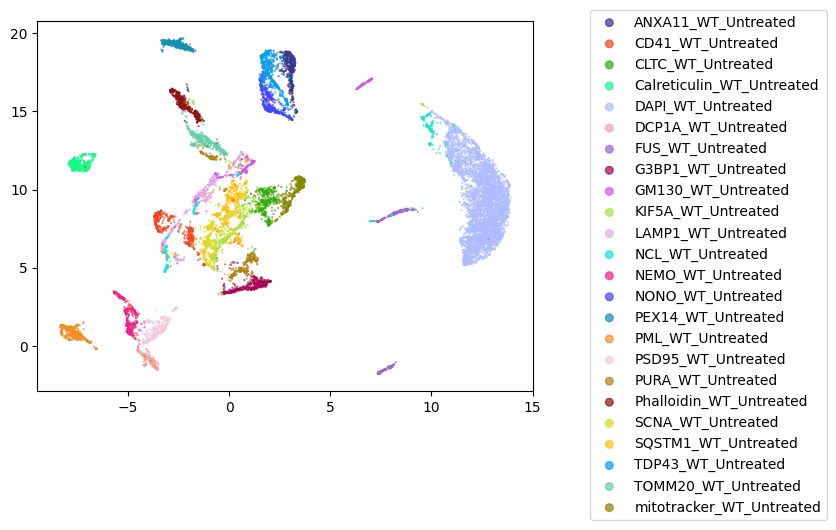

In [46]:
# UMAP1
########

plot_umap1(preds_array, lbls_array, markers=None)

['G3BP1_WT_Untreated', 'G3BP1_WT_stress'] G3BP1
classes: ['G3BP1_WT_Untreated' 'G3BP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: G3BP1_WT_Untreated, shappe: (834, 128)
class: G3BP1_WT_stress, shappe: (854, 128)


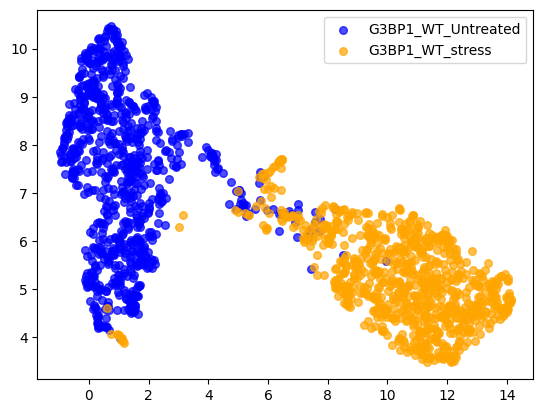

['PML_WT_Untreated', 'PML_WT_stress'] PML
classes: ['PML_WT_Untreated' 'PML_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PML_WT_Untreated, shappe: (701, 128)
class: PML_WT_stress, shappe: (785, 128)


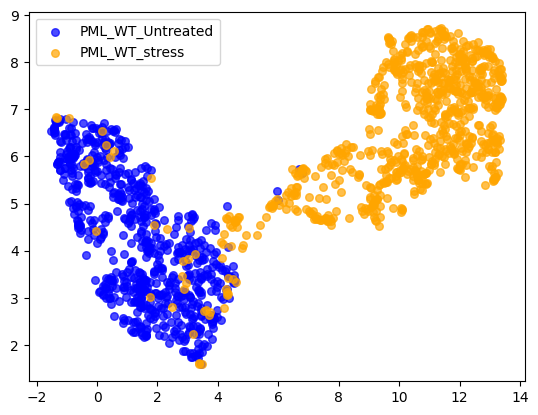

['PURA_WT_Untreated', 'PURA_WT_stress'] PURA
classes: ['PURA_WT_Untreated' 'PURA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PURA_WT_Untreated, shappe: (812, 128)
class: PURA_WT_stress, shappe: (854, 128)


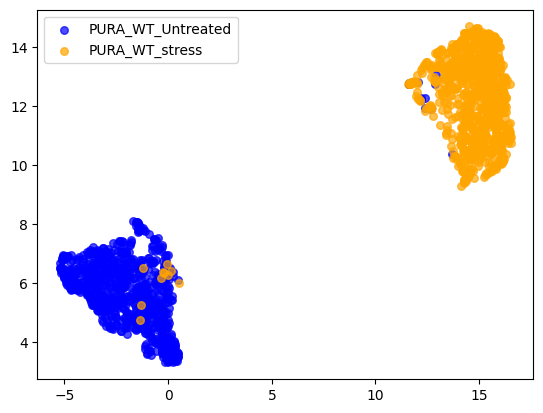

['LAMP1_WT_Untreated', 'LAMP1_WT_stress'] LAMP1
classes: ['LAMP1_WT_Untreated' 'LAMP1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: LAMP1_WT_Untreated, shappe: (544, 128)
class: LAMP1_WT_stress, shappe: (568, 128)


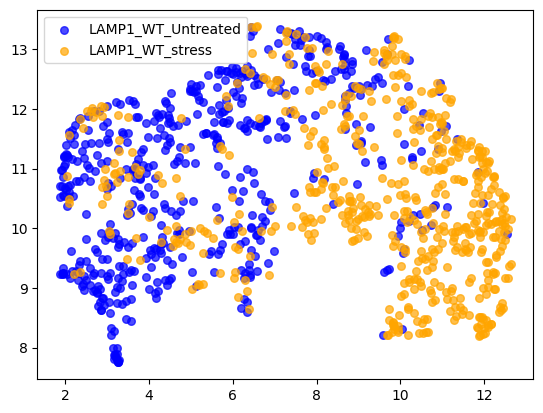

['Calreticulin_WT_Untreated', 'Calreticulin_WT_stress'] Calreticulin
classes: ['Calreticulin_WT_Untreated' 'Calreticulin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Calreticulin_WT_Untreated, shappe: (657, 128)
class: Calreticulin_WT_stress, shappe: (754, 128)


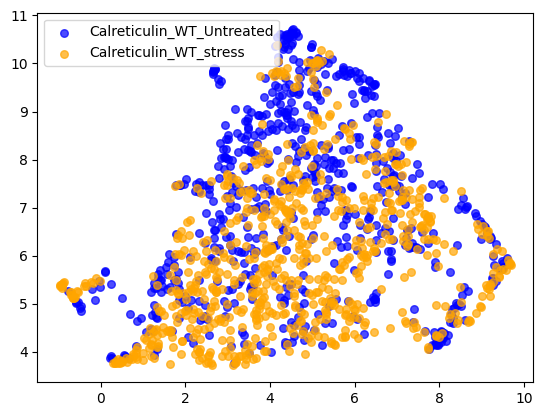

['TOMM20_WT_Untreated', 'TOMM20_WT_stress'] TOMM20
classes: ['TOMM20_WT_Untreated' 'TOMM20_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TOMM20_WT_Untreated, shappe: (762, 128)
class: TOMM20_WT_stress, shappe: (742, 128)


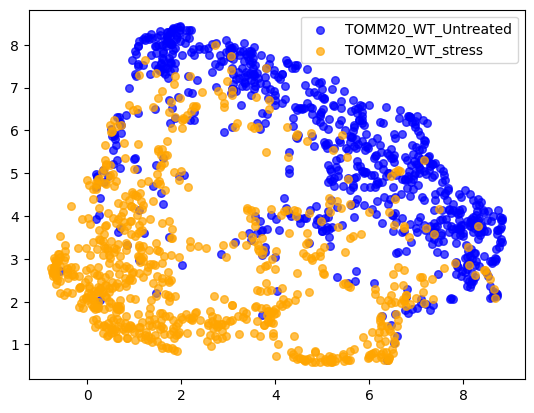

['PSD95_WT_Untreated', 'PSD95_WT_stress'] PSD95
classes: ['PSD95_WT_Untreated' 'PSD95_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PSD95_WT_Untreated, shappe: (661, 128)
class: PSD95_WT_stress, shappe: (699, 128)


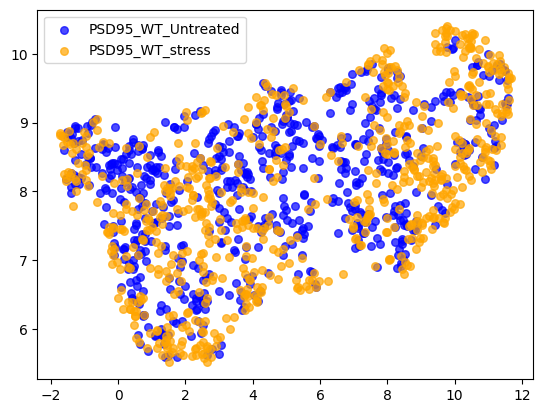

['mitotracker_WT_Untreated', 'mitotracker_WT_stress'] mitotracker
classes: ['mitotracker_WT_Untreated' 'mitotracker_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: mitotracker_WT_Untreated, shappe: (701, 128)
class: mitotracker_WT_stress, shappe: (785, 128)


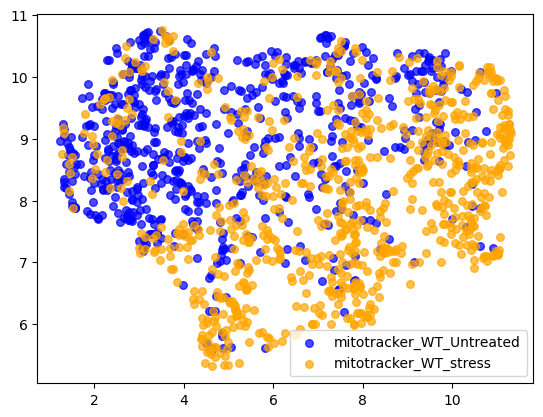

['KIF5A_WT_Untreated', 'KIF5A_WT_stress'] KIF5A
classes: ['KIF5A_WT_Untreated' 'KIF5A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: KIF5A_WT_Untreated, shappe: (834, 128)
class: KIF5A_WT_stress, shappe: (848, 128)


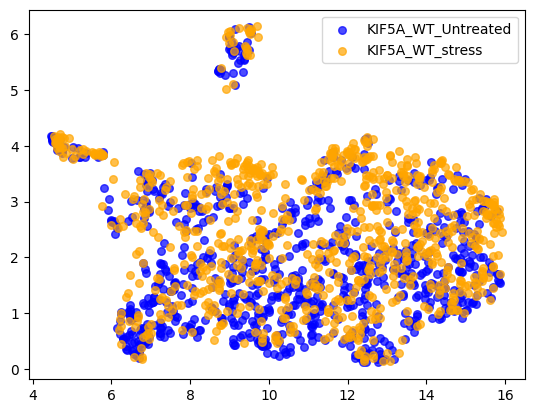

['CLTC_WT_Untreated', 'CLTC_WT_stress'] CLTC
classes: ['CLTC_WT_Untreated' 'CLTC_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CLTC_WT_Untreated, shappe: (666, 128)
class: CLTC_WT_stress, shappe: (699, 128)


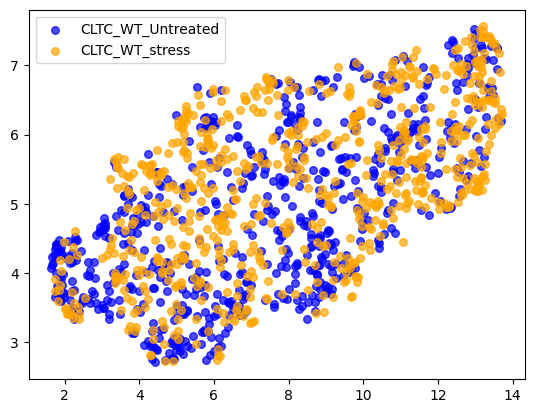

['SCNA_WT_Untreated', 'SCNA_WT_stress'] SCNA
classes: ['SCNA_WT_Untreated' 'SCNA_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SCNA_WT_Untreated, shappe: (724, 128)
class: SCNA_WT_stress, shappe: (718, 128)


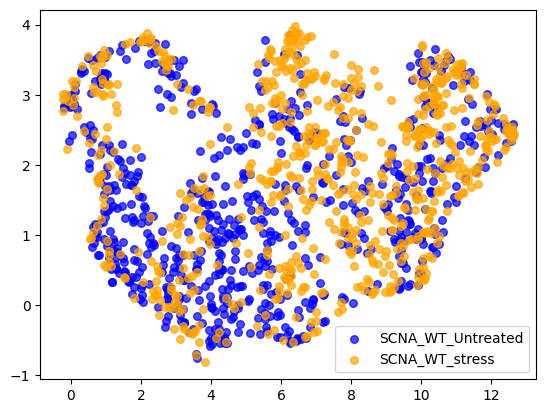

['CD41_WT_Untreated', 'CD41_WT_stress'] CD41
classes: ['CD41_WT_Untreated' 'CD41_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: CD41_WT_Untreated, shappe: (806, 128)
class: CD41_WT_stress, shappe: (772, 128)


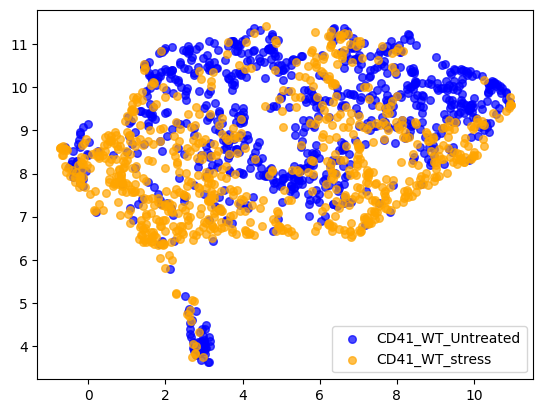

['FUS_WT_Untreated', 'FUS_WT_stress'] FUS
classes: ['FUS_WT_Untreated' 'FUS_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_WT_Untreated, shappe: (962, 128)
class: FUS_WT_stress, shappe: (965, 128)


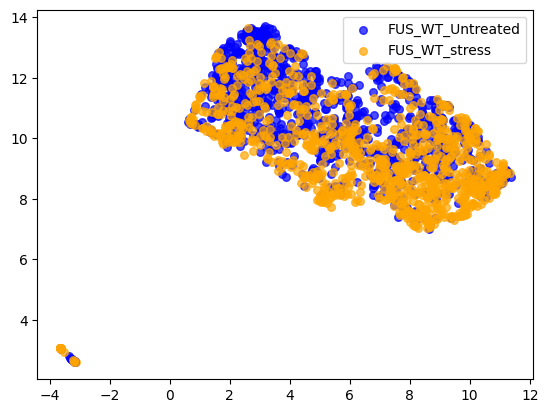

['ANXA11_WT_Untreated', 'ANXA11_WT_stress'] ANXA11
classes: ['ANXA11_WT_Untreated' 'ANXA11_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: ANXA11_WT_Untreated, shappe: (816, 128)
class: ANXA11_WT_stress, shappe: (780, 128)


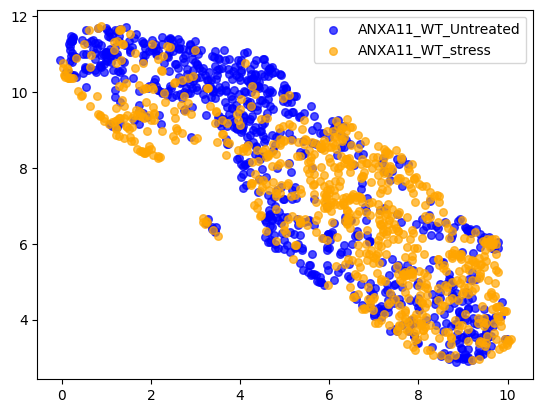

['Phalloidin_WT_Untreated', 'Phalloidin_WT_stress'] Phalloidin
classes: ['Phalloidin_WT_Untreated' 'Phalloidin_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: Phalloidin_WT_Untreated, shappe: (752, 128)
class: Phalloidin_WT_stress, shappe: (713, 128)


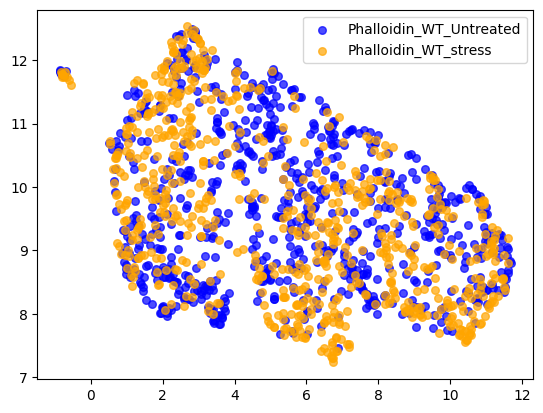

['SQSTM1_WT_Untreated', 'SQSTM1_WT_stress'] SQSTM1
classes: ['SQSTM1_WT_Untreated' 'SQSTM1_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: SQSTM1_WT_Untreated, shappe: (744, 128)
class: SQSTM1_WT_stress, shappe: (713, 128)


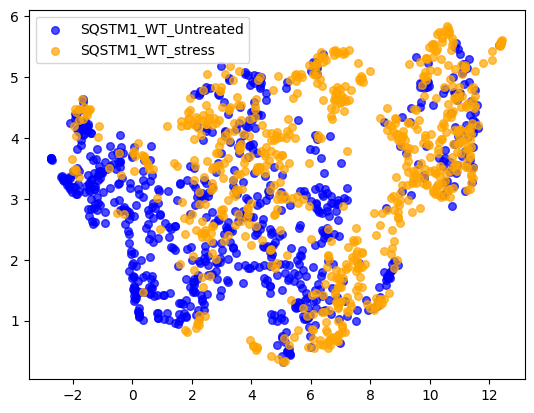

['GM130_WT_Untreated', 'GM130_WT_stress'] GM130
classes: ['GM130_WT_Untreated' 'GM130_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: GM130_WT_Untreated, shappe: (749, 128)
class: GM130_WT_stress, shappe: (742, 128)


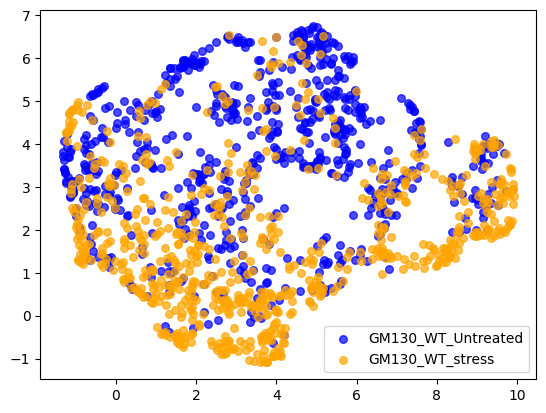

['TDP43_WT_Untreated', 'TDP43_WT_stress'] TDP43
classes: ['TDP43_WT_Untreated' 'TDP43_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43_WT_Untreated, shappe: (806, 128)
class: TDP43_WT_stress, shappe: (772, 128)


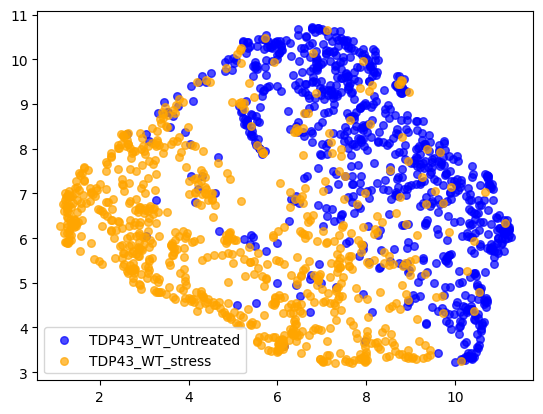

['PEX14_WT_Untreated', 'PEX14_WT_stress'] PEX14
classes: ['PEX14_WT_Untreated' 'PEX14_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: PEX14_WT_Untreated, shappe: (701, 128)
class: PEX14_WT_stress, shappe: (785, 128)


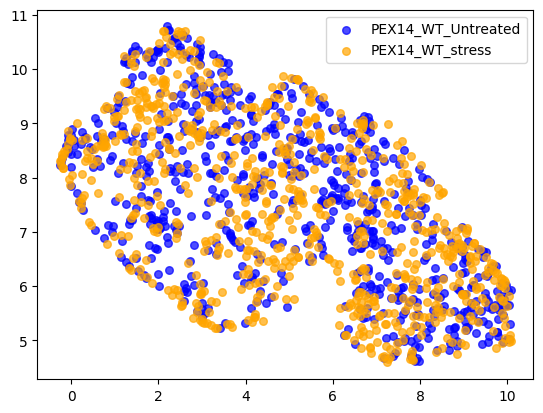

['NCL_WT_Untreated', 'NCL_WT_stress'] NCL
classes: ['NCL_WT_Untreated' 'NCL_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NCL_WT_Untreated, shappe: (962, 128)
class: NCL_WT_stress, shappe: (954, 128)


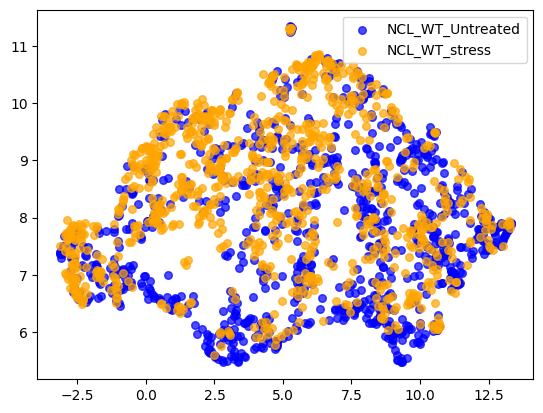

['NONO_WT_Untreated', 'NONO_WT_stress'] NONO
classes: ['NONO_WT_Untreated' 'NONO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NONO_WT_Untreated, shappe: (806, 128)
class: NONO_WT_stress, shappe: (772, 128)


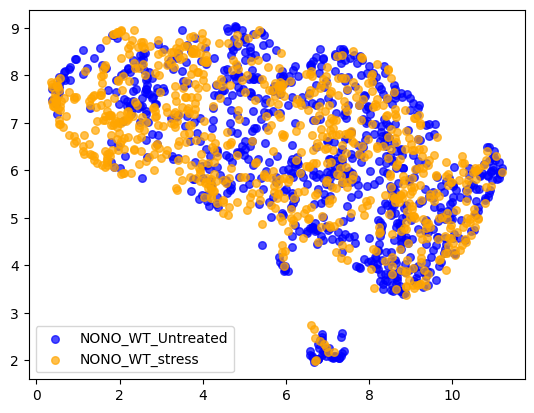

['DCP1A_WT_Untreated', 'DCP1A_WT_stress'] DCP1A
classes: ['DCP1A_WT_Untreated' 'DCP1A_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: DCP1A_WT_Untreated, shappe: (203, 128)
class: DCP1A_WT_stress, shappe: (709, 128)


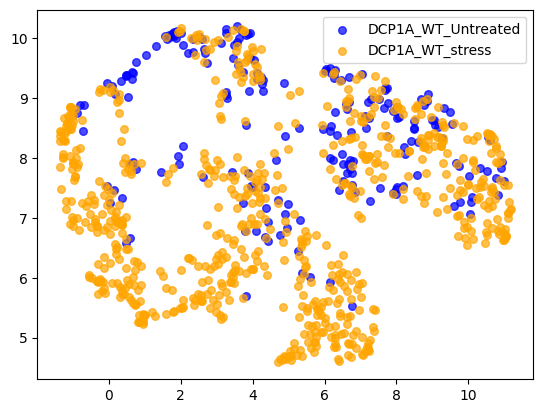

['NEMO_WT_Untreated', 'NEMO_WT_stress'] NEMO
classes: ['NEMO_WT_Untreated' 'NEMO_WT_stress']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: NEMO_WT_Untreated, shappe: (540, 128)
class: NEMO_WT_stress, shappe: (762, 128)


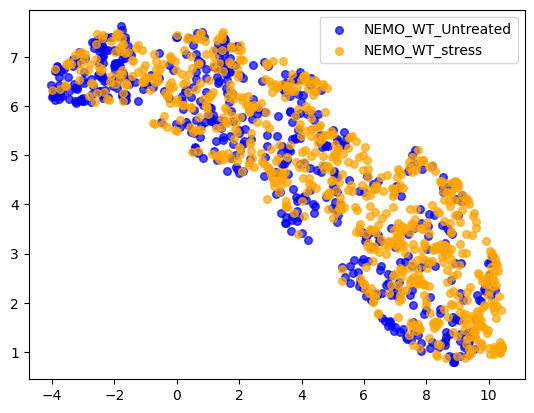

In [58]:
# UMAP0
#######

cell_lines = [[f'WT_Untreated', f'WT_stress']]#,
                     # [f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['G3BP1', 'PML', "PURA", "LAMP1", 'Calreticulin', 'TOMM20', 'PSD95', \
                       'mitotracker', 'KIF5A', 'CLTC', 'SCNA', 'CD41', 'FUS', 'ANXA11',\
                       'Phalloidin', 'SQSTM1', 'GM130', 'TDP43', 'PEX14', 'NCL', 'NONO', 'DCP1A', 'NEMO']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['FUS_FUSHeterozygous', 'FUS_FUSHomozygous', 'FUS_FUSRevertant', 'FUS_WT_Untreated'] FUS
classes: ['FUS_FUSHeterozygous_Untreated' 'FUS_FUSHomozygous_Untreated'
 'FUS_FUSRevertant_Untreated' 'FUS_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: FUS_FUSHeterozygous_Untreated, shappe: (386, 128)
class: FUS_FUSHomozygous_Untreated, shappe: (989, 128)
class: FUS_FUSRevertant_Untreated, shappe: (1011, 128)
class: FUS_WT_Untreated, shappe: (962, 128)


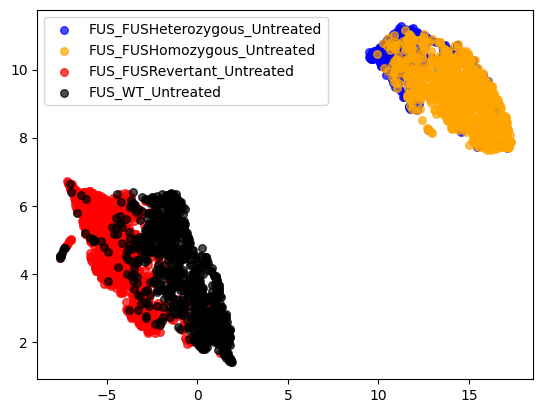

In [65]:
# UMAP0
#######

cell_lines =  [[f'FUSHeterozygous', f'FUSHomozygous', f'FUSRevertant', f'WT_Untreated']]
markers_sorted = ['FUS']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['TDP43N_WT_Untreated_batch2', 'TDP43N_TDP43_Untreated_batch2', 'TDP43N_TDP43_dox_batch2'] TDP43N
classes: ['TDP43N_TDP43_Untreated_batch2' 'TDP43N_TDP43_dox_batch2'
 'TDP43N_WT_Untreated_batch2']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43N_TDP43_Untreated_batch2, shappe: (1422, 128)
class: TDP43N_TDP43_dox_batch2, shappe: (1499, 128)
class: TDP43N_WT_Untreated_batch2, shappe: (501, 128)


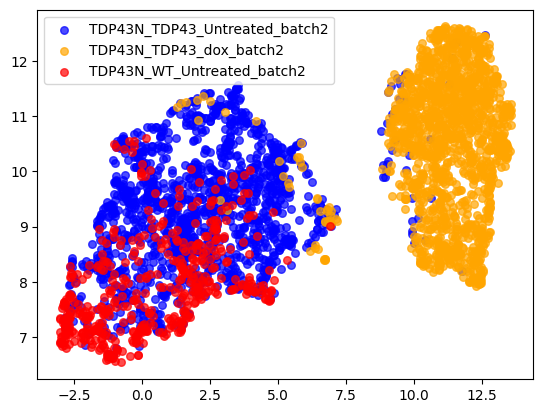

In [68]:
# UMAP0
#######

cell_lines =  [[f'WT_Untreated_batch2', f'TDP43_Untreated_batch2', f'TDP43_dox_batch2']]
markers_sorted = ['TDP43N']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)

['TDP43B_WT_Untreated', 'TDP43B_TDP43_Untreated', 'TDP43B_TDP43_dox'] TDP43B
classes: ['TDP43B_TDP43_Untreated' 'TDP43B_TDP43_dox' 'TDP43B_WT_Untreated']


/home/labs/hornsteinlab/sagyk/anaconda3/envs/momapsD/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


class: TDP43B_TDP43_Untreated, shappe: (1311, 128)
class: TDP43B_TDP43_dox, shappe: (1474, 128)
class: TDP43B_WT_Untreated, shappe: (570, 128)


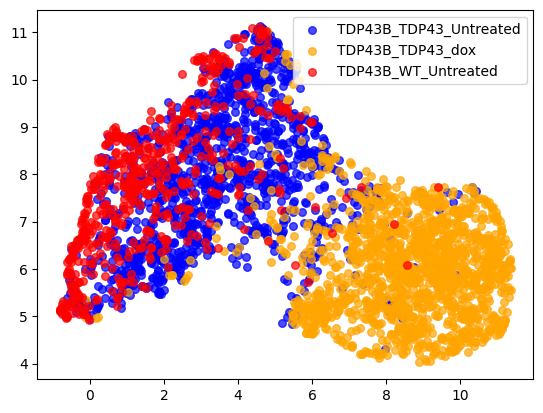

In [72]:
# UMAP0
#######

cell_lines =  [[f'WT_Untreated', f'TDP43_Untreated', f'TDP43_dox']]
markers_sorted = ['TDP43B']
plot_umap_all_conditions(preds_array, lbls_array, prefs=cell_lines,
                            ordered_markers=markers_sorted)